# Traffic Analysis

## Setup

In [1]:
%load_ext autoreload
%autoreload 2
%matplotlib notebook

import datetime
import sys
from typing import Iterable

sys.path.append("../../..")

In [2]:
import iso3166
import matplotlib
from matplotlib import pyplot
import pandas as pd

matplotlib.rcParams["figure.figsize"] = (9.5, 10.0)
matplotlib.rcParams["figure.max_open_warning"] = 100

In [3]:
import netanalysis.traffic.data.model as traffic
from netanalysis.traffic.data.file_repository import FileTrafficRepository
import netanalysis.traffic.analysis.find_anomalies as fa
from netanalysis.infrastructure.resources import resource_filename

PRODUCT_LIST = [
    traffic.ProductId.WEB_SEARCH, traffic.ProductId.MAPS, traffic.ProductId.IMAGES,
    traffic.ProductId.YOUTUBE, traffic.ProductId.BLOGGER, traffic.ProductId.SITES,
    traffic.ProductId.GMAIL, traffic.ProductId.GROUPS,
    traffic.ProductId.TRANSLATE,
    traffic.ProductId.SPREADSHEETS, traffic.ProductId.DOCS,
    traffic.ProductId.EARTH
]
repo = FileTrafficRepository(resource_filename("traffic_data"))

In [4]:
def plot_expectations(time_series, expectations):
    time_series.plot()
    expectations.expected.plot(linewidth=1)
    pyplot.fill_between(time_series.index, expectations.lower_bound, expectations.upper_bound, alpha=0.3, linewidth=0)
    anomalous_dates = (time_series < expectations.lower_bound).loc[lambda e: e].index
    if not anomalous_dates.empty:
        time_series[anomalous_dates].plot(style='ro')

In [15]:
def show_region_traffic(region_code, product_ids) -> None:
    fig = pyplot.figure()
    for index, product_id in enumerate(product_ids):
        hires_traffic = repo.get_traffic(region_code, product_id)
        if hires_traffic.empty:
            continue    
        time_series = hires_traffic.resample("D").mean()
        expectations = fa.get_expectations_1(time_series)
        axes = fig.add_subplot(len(product_ids), 1, index + 1)
        axes.set_ylabel(product_id.name)
        axes.set_ylim(bottom=0, top=time_series.max()*1.1)
        plot_expectations(time_series["2016":], expectations["2016":])
        fig.show()

def show_product_traffic(product_id: traffic.ProductId, regions: Iterable[str]) -> None:
    fig = pyplot.figure()
    for index, region_code in enumerate(regions):
        hires_traffic = repo.get_traffic(region_code, product_id)
        if hires_traffic.empty:
            continue    
        time_series = hires_traffic.resample("D").mean()
        expectations = fa.get_expectations_1(time_series)
        axes = fig.add_subplot(len(regions), 1, index + 1)
        axes.set_ylabel(region_code)
        axes.set_ylim(bottom=0, top=time_series.max()*1.1)
        plot_expectations(time_series["2016":], expectations["2016":])
        fig.show()

## Analysis

In [6]:
# INTERESTING_REGIONS = [
#     "DZ", "BY", "CM", "CD", "EG", "ET", "GA", "GM", "IN", "IR", "IQ", "PK", "SA", "SY", "TG", "TR", "UA", "VN",
#     "PR", "VI", "TC", "US", "ZW"
# ]
INTERESTING_REGIONS = repo.list_regions()

In [ ]:
all_disruptions = fa.find_all_disruptions(repo, INTERESTING_REGIONS, [traffic.ProductId.YOUTUBE, traffic.ProductId.WEB_SEARCH])
all_disruptions.sort(reverse=True, key=lambda d: (d.start, d.end))

## Internet Outages

In [8]:
def show_disruption(region_disruption):
    num_product_disruptions = len(region_disruption.product_disruptions)
    num_columns = 3
    num_rows = (num_product_disruptions + 1) / 2
    fig = pyplot.figure(figsize=(num_columns * 3.2, num_rows * 2.5))
    fig.tight_layout()
    fig.suptitle("%s %s - %s" % (iso3166.countries.get(region_disruption.region_code).name, region_disruption.start.date(), region_disruption.end.date()))
    end_date = region_disruption.end + datetime.timedelta(days=1)
    duration = end_date - region_disruption.start
    chart_padding = duration * 2
    chart_start_date = region_disruption.start - chart_padding
    chart_end_date = min(end_date + chart_padding, datetime.datetime.now())
    for index, product_disruption in enumerate(region_disruption.product_disruptions):
        chart_traffic = repo.get_traffic(
            region_disruption.region_code, product_disruption.product_id)[chart_start_date:chart_end_date]
        axes = fig.add_subplot(num_rows, num_columns, index + 1)
        axes.set_ylabel(product_disruption.product_id.name)
        axes.set_ylim(bottom=0, top=chart_traffic.max()*1.1)
        axes.plot(chart_traffic)
        axes.axvspan(region_disruption.start, region_disruption.end, alpha=0.2, color='grey')
    fig.show()

Found 46 shutdowns


<IPython.core.display.Javascript object>


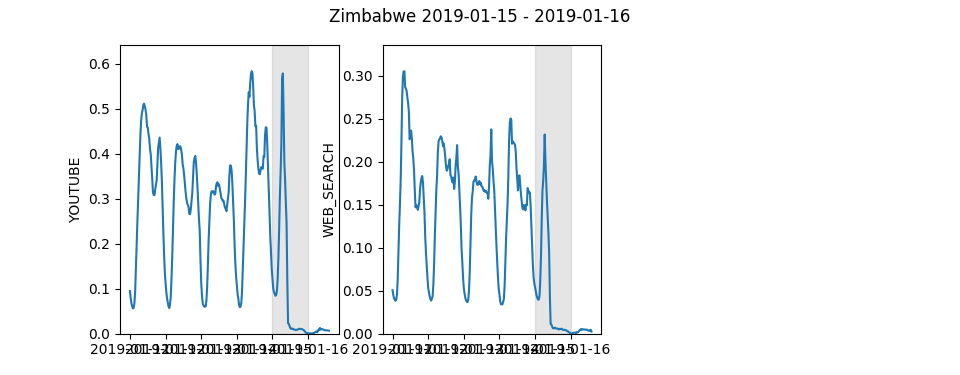

Zimbabwe (ZW) 2019-01-15 2019-01-16 Context: https://www.google.com/search?q=internet+Zimbabwe&tbs=cdr%3A1%2Ccd_min%3A01%2F15%2F2019%2Ccd_max%3A01%2F22%2F2019 https://twitter.com/search?q=internet+Zimbabwe+since%3A2019-01-15+until%3A2019-01-22 https://metrics.torproject.org/userstats-relay-country.html?events=on&start=2019-01-11&end=2019-01-16&country=ZW
    YOUTUBE, 2019-01-15, 2019-01-16, 2.295210, 0.550291, https://transparencyreport.google.com/traffic/overview?lu=fraction_traffic&fraction_traffic=product%3A21%3Bstart%3A1547182800000%3Bend%3A1547680398000%3Bregion%3AZW
    WEB_SEARCH, 2019-01-15, 2019-01-16, 1.665479, 0.289629, https://transparencyreport.google.com/traffic/overview?lu=fraction_traffic&fraction_traffic=product%3A19%3Bstart%3A1547182800000%3Bend%3A1547680398000%3Bregion%3AZW


<IPython.core.display.Javascript object>


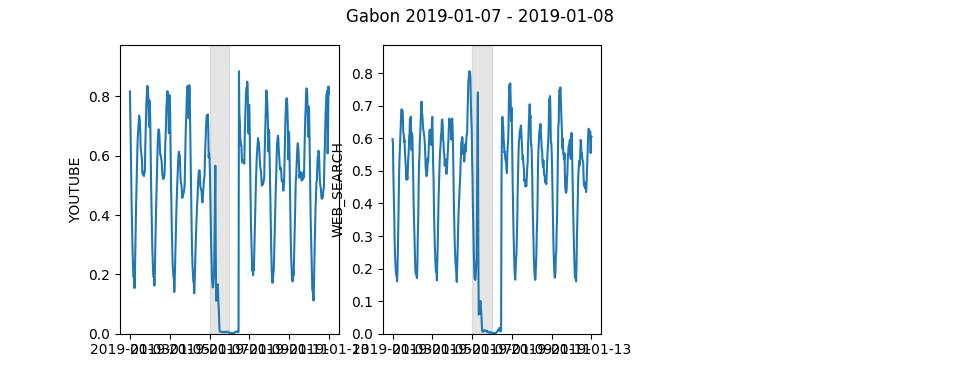

Gabon (GA) 2019-01-07 2019-01-08 Context: https://www.google.com/search?q=internet+Gabon&tbs=cdr%3A1%2Ccd_min%3A01%2F07%2F2019%2Ccd_max%3A01%2F14%2F2019 https://twitter.com/search?q=internet+Gabon+since%3A2019-01-07+until%3A2019-01-14 https://metrics.torproject.org/userstats-relay-country.html?events=on&start=2019-01-03&end=2019-01-13&country=GA
    YOUTUBE, 2019-01-07, 2019-01-08, 1.401481, 0.512362, https://transparencyreport.google.com/traffic/overview?lu=fraction_traffic&fraction_traffic=product%3A21%3Bstart%3A1546491600000%3Bend%3A1547355600000%3Bregion%3AGA
    WEB_SEARCH, 2019-01-07, 2019-01-08, 1.128474, 0.462275, https://transparencyreport.google.com/traffic/overview?lu=fraction_traffic&fraction_traffic=product%3A19%3Bstart%3A1546491600000%3Bend%3A1547355600000%3Bregion%3AGA


<IPython.core.display.Javascript object>


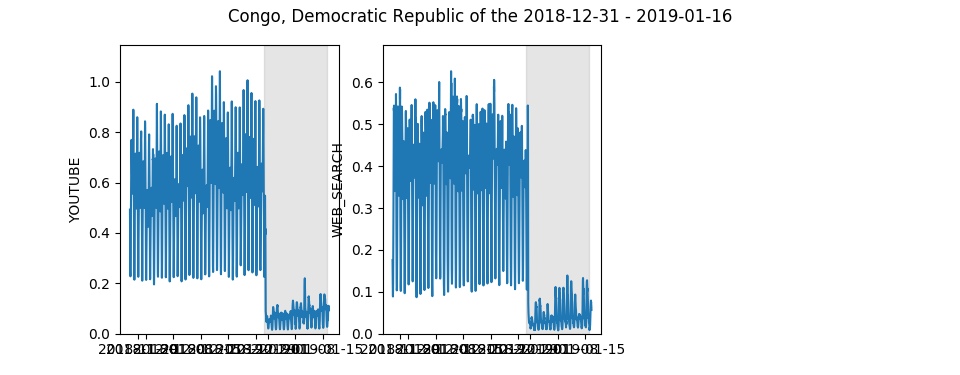

Congo, Democratic Republic of the (CD) 2018-12-31 2019-01-16 Context: https://www.google.com/search?q=internet+Congo%2C+Democratic+Republic+of+the&tbs=cdr%3A1%2Ccd_min%3A12%2F31%2F2018%2Ccd_max%3A01%2F07%2F2019 https://twitter.com/search?q=internet+Congo%2C+Democratic+Republic+of+the+since%3A2018-12-31+until%3A2019-01-07 https://metrics.torproject.org/userstats-relay-country.html?events=on&start=2018-11-27&end=2019-01-16&country=CD
    YOUTUBE, 2018-12-31, 2019-01-16, 23.371291, 6.926307, https://transparencyreport.google.com/traffic/overview?lu=fraction_traffic&fraction_traffic=product%3A21%3Bstart%3A1543294800000%3Bend%3A1547680399000%3Bregion%3ACD
    WEB_SEARCH, 2018-12-31, 2019-01-16, 12.556809, 4.521958, https://transparencyreport.google.com/traffic/overview?lu=fraction_traffic&fraction_traffic=product%3A19%3Bstart%3A1543294800000%3Bend%3A1547680399000%3Bregion%3ACD


<IPython.core.display.Javascript object>


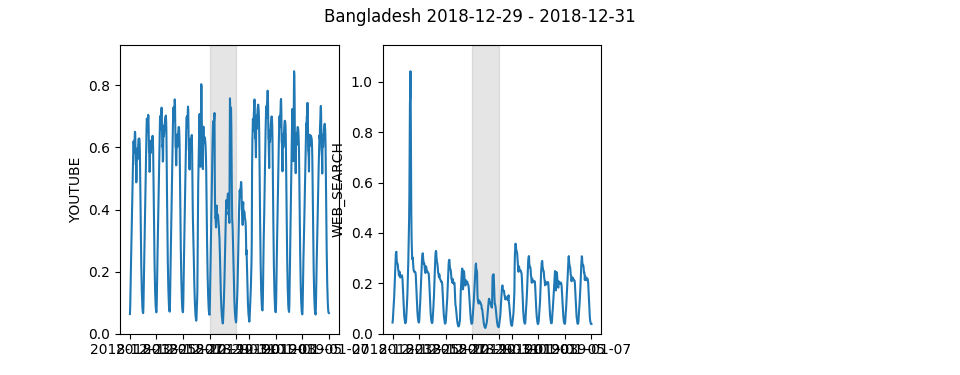

Bangladesh (BD) 2018-12-29 2018-12-31 Context: https://www.google.com/search?q=internet+Bangladesh&tbs=cdr%3A1%2Ccd_min%3A12%2F29%2F2018%2Ccd_max%3A01%2F05%2F2019 https://twitter.com/search?q=internet+Bangladesh+since%3A2018-12-29+until%3A2019-01-05 https://metrics.torproject.org/userstats-relay-country.html?events=on&start=2018-12-23&end=2019-01-07&country=BD
    YOUTUBE, 2018-12-29, 2018-12-31, 1.819828, 0.429560, https://transparencyreport.google.com/traffic/overview?lu=fraction_traffic&fraction_traffic=product%3A21%3Bstart%3A1545541200000%3Bend%3A1546837200000%3Bregion%3ABD
    WEB_SEARCH, 2018-12-29, 2018-12-31, 1.525780, 0.205523, https://transparencyreport.google.com/traffic/overview?lu=fraction_traffic&fraction_traffic=product%3A19%3Bstart%3A1545541200000%3Bend%3A1546837200000%3Bregion%3ABD


<IPython.core.display.Javascript object>


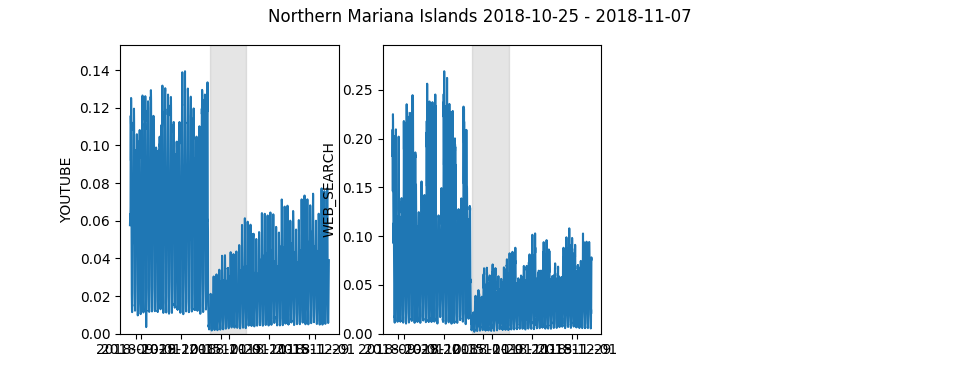

Northern Mariana Islands (MP) 2018-10-25 2018-11-07 Context: https://www.google.com/search?q=internet+Northern+Mariana+Islands&tbs=cdr%3A1%2Ccd_min%3A10%2F25%2F2018%2Ccd_max%3A11%2F01%2F2018 https://twitter.com/search?q=internet+Northern+Mariana+Islands+since%3A2018-10-25+until%3A2018-11-01 https://metrics.torproject.org/userstats-relay-country.html?events=on&start=2018-09-27&end=2018-12-06&country=MP
    YOUTUBE, 2018-10-25, 2018-11-03, 4.387765, 0.446386, https://transparencyreport.google.com/traffic/overview?lu=fraction_traffic&fraction_traffic=product%3A21%3Bstart%3A1538712000000%3Bend%3A1543035600000%3Bregion%3AMP
    WEB_SEARCH, 2018-10-25, 2018-11-07, 5.958166, 0.730005, https://transparencyreport.google.com/traffic/overview?lu=fraction_traffic&fraction_traffic=product%3A19%3Bstart%3A1538020800000%3Bend%3A1544072400000%3Bregion%3AMP


<IPython.core.display.Javascript object>


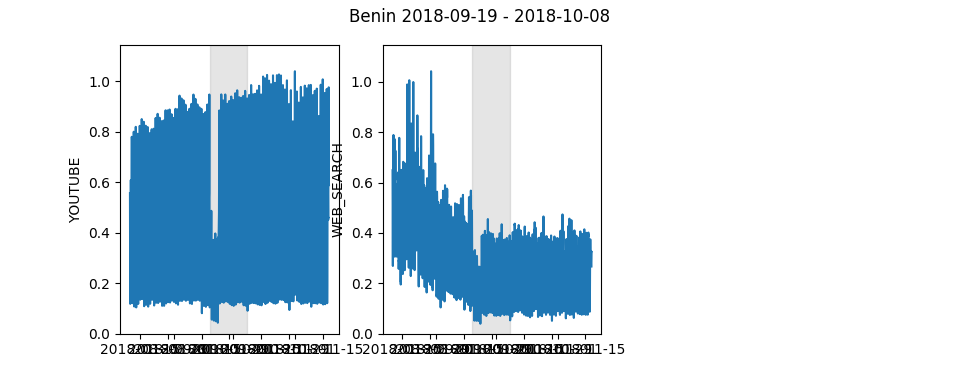

Benin (BJ) 2018-09-19 2018-10-08 Context: https://www.google.com/search?q=internet+Benin&tbs=cdr%3A1%2Ccd_min%3A09%2F19%2F2018%2Ccd_max%3A09%2F26%2F2018 https://twitter.com/search?q=internet+Benin+since%3A2018-09-19+until%3A2018-09-26 https://metrics.torproject.org/userstats-relay-country.html?events=on&start=2018-08-10&end=2018-11-18&country=BJ
    YOUTUBE, 2018-09-19, 2018-09-22, 4.453436, 0.883378, https://transparencyreport.google.com/traffic/overview?lu=fraction_traffic&fraction_traffic=product%3A21%3Bstart%3A1536638400000%3Bend%3A1538366400000%3Bregion%3ABJ
    WEB_SEARCH, 2018-09-19, 2018-10-08, 14.452033, 3.043682, https://transparencyreport.google.com/traffic/overview?lu=fraction_traffic&fraction_traffic=product%3A19%3Bstart%3A1533873600000%3Bend%3A1542517200000%3Bregion%3ABJ


<IPython.core.display.Javascript object>


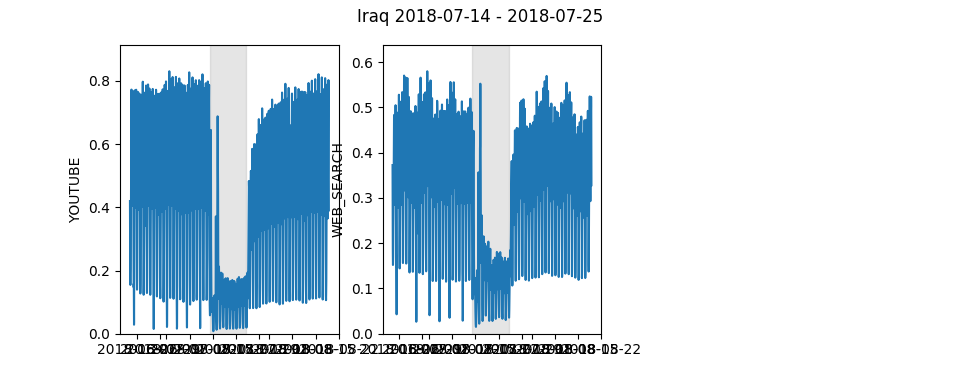

Iraq (IQ) 2018-07-14 2018-07-25 Context: https://www.google.com/search?q=internet+Iraq&tbs=cdr%3A1%2Ccd_min%3A07%2F14%2F2018%2Ccd_max%3A07%2F21%2F2018 https://twitter.com/search?q=internet+Iraq+since%3A2018-07-14+until%3A2018-07-21 https://metrics.torproject.org/userstats-relay-country.html?events=on&start=2018-06-20&end=2018-08-19&country=IQ
    YOUTUBE, 2018-07-14, 2018-07-25, 9.917871, 3.619467, https://transparencyreport.google.com/traffic/overview?lu=fraction_traffic&fraction_traffic=product%3A21%3Bstart%3A1529467200000%3Bend%3A1534651200000%3Bregion%3AIQ
    WEB_SEARCH, 2018-07-14, 2018-07-24, 5.273499, 1.946801, https://transparencyreport.google.com/traffic/overview?lu=fraction_traffic&fraction_traffic=product%3A19%3Bstart%3A1529640000000%3Bend%3A1534392000000%3Bregion%3AIQ


<IPython.core.display.Javascript object>


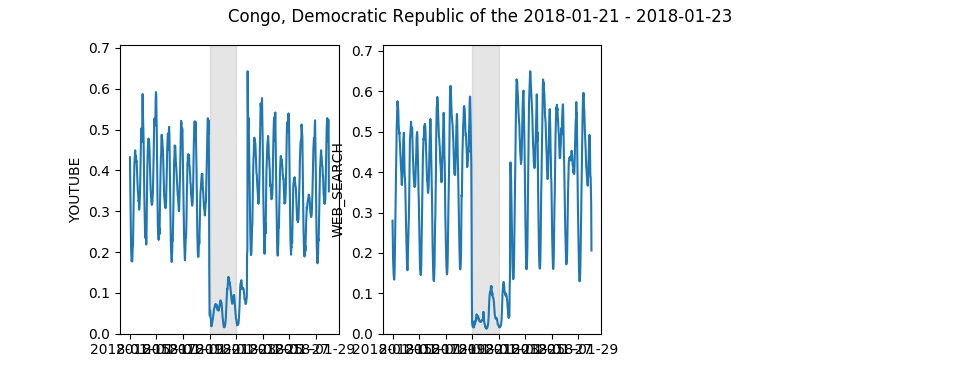

Congo, Democratic Republic of the (CD) 2018-01-21 2018-01-23 Context: https://www.google.com/search?q=internet+Congo%2C+Democratic+Republic+of+the&tbs=cdr%3A1%2Ccd_min%3A01%2F21%2F2018%2Ccd_max%3A01%2F28%2F2018 https://twitter.com/search?q=internet+Congo%2C+Democratic+Republic+of+the+since%3A2018-01-21+until%3A2018-01-28 https://metrics.torproject.org/userstats-relay-country.html?events=on&start=2018-01-15&end=2018-01-30&country=CD
    YOUTUBE, 2018-01-21, 2018-01-23, 2.368734, 0.701997, https://transparencyreport.google.com/traffic/overview?lu=fraction_traffic&fraction_traffic=product%3A21%3Bstart%3A1515992400000%3Bend%3A1517288400000%3Bregion%3ACD
    WEB_SEARCH, 2018-01-21, 2018-01-23, 2.485793, 0.895184, https://transparencyreport.google.com/traffic/overview?lu=fraction_traffic&fraction_traffic=product%3A19%3Bstart%3A1515992400000%3Bend%3A1517288400000%3Bregion%3ACD


<IPython.core.display.Javascript object>


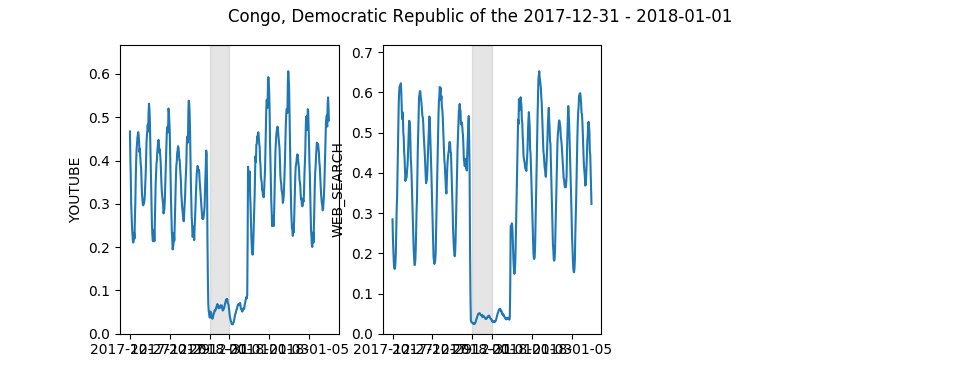

Congo, Democratic Republic of the (CD) 2017-12-31 2018-01-01 Context: https://www.google.com/search?q=internet+Congo%2C+Democratic+Republic+of+the&tbs=cdr%3A1%2Ccd_min%3A12%2F31%2F2017%2Ccd_max%3A01%2F07%2F2018 https://twitter.com/search?q=internet+Congo%2C+Democratic+Republic+of+the+since%3A2017-12-31+until%3A2018-01-07 https://metrics.torproject.org/userstats-relay-country.html?events=on&start=2017-12-27&end=2018-01-06&country=CD
    YOUTUBE, 2017-12-31, 2018-01-01, 1.828890, 0.542009, https://transparencyreport.google.com/traffic/overview?lu=fraction_traffic&fraction_traffic=product%3A21%3Bstart%3A1514350800000%3Bend%3A1515214800000%3Bregion%3ACD
    WEB_SEARCH, 2017-12-31, 2018-01-01, 1.805916, 0.650347, https://transparencyreport.google.com/traffic/overview?lu=fraction_traffic&fraction_traffic=product%3A19%3Bstart%3A1514350800000%3Bend%3A1515214800000%3Bregion%3ACD


<IPython.core.display.Javascript object>


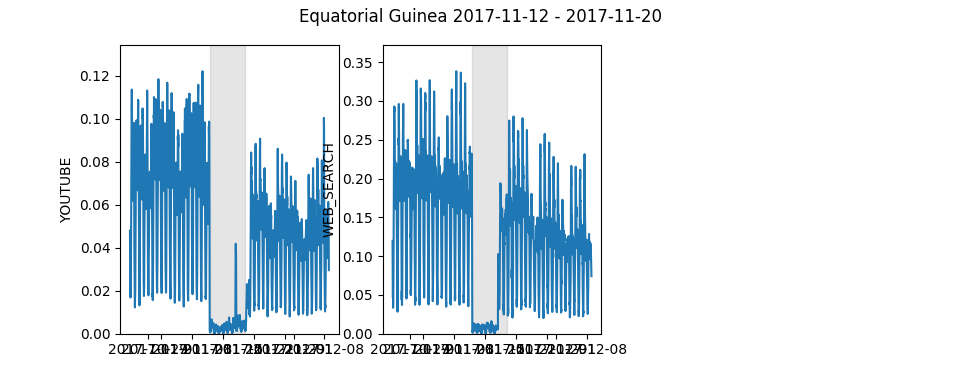

Equatorial Guinea (GQ) 2017-11-12 2017-11-20 Context: https://www.google.com/search?q=internet+Equatorial+Guinea&tbs=cdr%3A1%2Ccd_min%3A11%2F12%2F2017%2Ccd_max%3A11%2F19%2F2017 https://twitter.com/search?q=internet+Equatorial+Guinea+since%3A2017-11-12+until%3A2017-11-19 https://metrics.torproject.org/userstats-relay-country.html?events=on&start=2017-10-25&end=2017-12-09&country=GQ
    YOUTUBE, 2017-11-12, 2017-11-20, 7.432069, 0.460676, https://transparencyreport.google.com/traffic/overview?lu=fraction_traffic&fraction_traffic=product%3A21%3Bstart%3A1508904000000%3Bend%3A1512795600000%3Bregion%3AGQ
    WEB_SEARCH, 2017-11-12, 2017-11-17, 5.487304, 0.844172, https://transparencyreport.google.com/traffic/overview?lu=fraction_traffic&fraction_traffic=product%3A19%3Bstart%3A1509422400000%3Bend%3A1512018000000%3Bregion%3AGQ


<IPython.core.display.Javascript object>


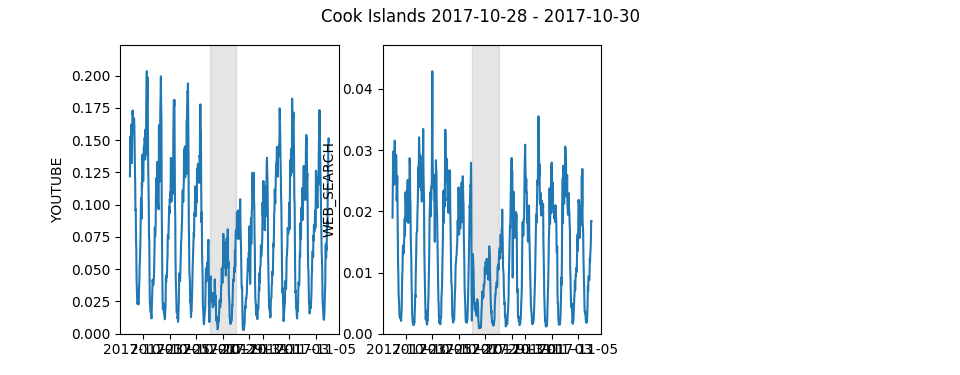

Cook Islands (CK) 2017-10-28 2017-10-30 Context: https://www.google.com/search?q=internet+Cook+Islands&tbs=cdr%3A1%2Ccd_min%3A10%2F28%2F2017%2Ccd_max%3A11%2F04%2F2017 https://twitter.com/search?q=internet+Cook+Islands+since%3A2017-10-28+until%3A2017-11-04 https://metrics.torproject.org/userstats-relay-country.html?events=on&start=2017-10-22&end=2017-11-06&country=CK
    YOUTUBE, 2017-10-28, 2017-10-30, 1.683757, 0.167913, https://transparencyreport.google.com/traffic/overview?lu=fraction_traffic&fraction_traffic=product%3A21%3Bstart%3A1508644800000%3Bend%3A1509944400000%3Bregion%3ACK
    WEB_SEARCH, 2017-10-28, 2017-10-29, 1.267013, 0.020115, https://transparencyreport.google.com/traffic/overview?lu=fraction_traffic&fraction_traffic=product%3A19%3Bstart%3A1508817600000%3Bend%3A1509681600000%3Bregion%3ACK


<IPython.core.display.Javascript object>


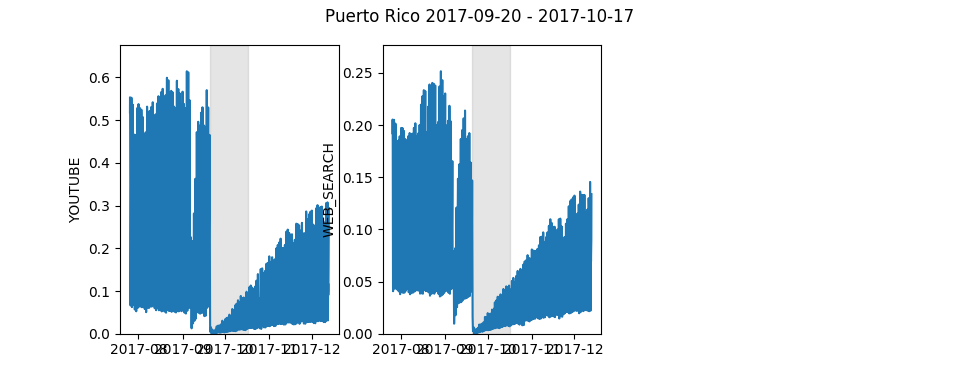

Puerto Rico (PR) 2017-09-20 2017-10-17 Context: https://www.google.com/search?q=internet+Puerto+Rico&tbs=cdr%3A1%2Ccd_min%3A09%2F20%2F2017%2Ccd_max%3A09%2F27%2F2017 https://twitter.com/search?q=internet+Puerto+Rico+since%3A2017-09-20+until%3A2017-09-27 https://metrics.torproject.org/userstats-relay-country.html?events=on&start=2017-07-26&end=2017-12-13&country=PR
    YOUTUBE, 2017-09-20, 2017-10-16, 17.372744, 4.702362, https://transparencyreport.google.com/traffic/overview?lu=fraction_traffic&fraction_traffic=product%3A21%3Bstart%3A1501214400000%3Bend%3A1512882000000%3Bregion%3APR
    WEB_SEARCH, 2017-09-20, 2017-10-17, 17.187985, 1.969055, https://transparencyreport.google.com/traffic/overview?lu=fraction_traffic&fraction_traffic=product%3A19%3Bstart%3A1501041600000%3Bend%3A1513141200000%3Bregion%3APR


<IPython.core.display.Javascript object>


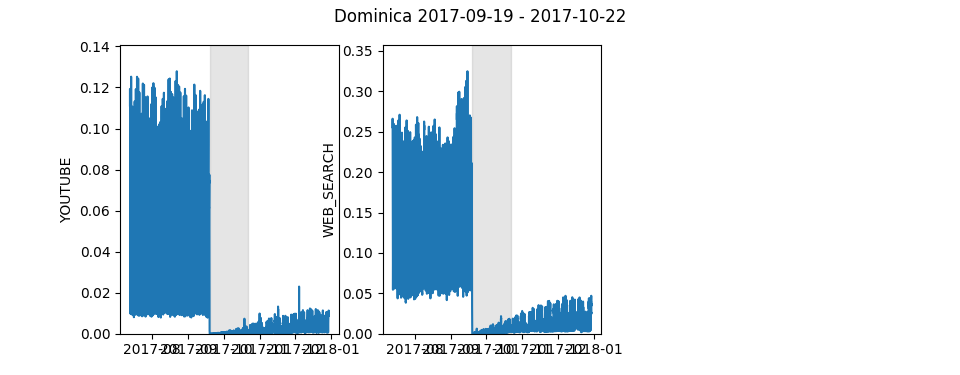

Dominica (DM) 2017-09-19 2017-10-22 Context: https://www.google.com/search?q=internet+Dominica&tbs=cdr%3A1%2Ccd_min%3A09%2F19%2F2017%2Ccd_max%3A09%2F26%2F2017 https://twitter.com/search?q=internet+Dominica+since%3A2017-09-19+until%3A2017-09-26 https://metrics.torproject.org/userstats-relay-country.html?events=on&start=2017-07-13&end=2017-12-30&country=DM
    YOUTUBE, 2017-09-19, 2017-10-18, 26.912117, 1.161760, https://transparencyreport.google.com/traffic/overview?lu=fraction_traffic&fraction_traffic=product%3A21%3Bstart%3A1500609600000%3Bend%3A1513573200000%3Bregion%3ADM
    WEB_SEARCH, 2017-09-19, 2017-10-22, 26.776132, 3.151589, https://transparencyreport.google.com/traffic/overview?lu=fraction_traffic&fraction_traffic=product%3A19%3Bstart%3A1499918400000%3Bend%3A1514610000000%3Bregion%3ADM


<IPython.core.display.Javascript object>


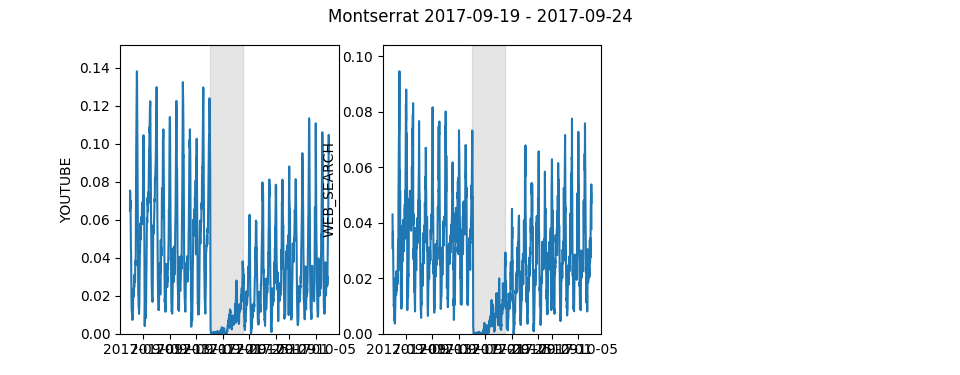

Montserrat (MS) 2017-09-19 2017-09-24 Context: https://www.google.com/search?q=internet+Montserrat&tbs=cdr%3A1%2Ccd_min%3A09%2F19%2F2017%2Ccd_max%3A09%2F26%2F2017 https://twitter.com/search?q=internet+Montserrat+since%3A2017-09-19+until%3A2017-09-26 https://metrics.torproject.org/userstats-relay-country.html?events=on&start=2017-09-07&end=2017-10-07&country=MS
    YOUTUBE, 2017-09-19, 2017-09-24, 5.197118, 0.240786, https://transparencyreport.google.com/traffic/overview?lu=fraction_traffic&fraction_traffic=product%3A21%3Bstart%3A1504756800000%3Bend%3A1507348800000%3Bregion%3AMS
    WEB_SEARCH, 2017-09-19, 2017-09-21, 2.442690, 0.081281, https://transparencyreport.google.com/traffic/overview?lu=fraction_traffic&fraction_traffic=product%3A19%3Bstart%3A1505275200000%3Bend%3A1506571200000%3Bregion%3AMS


<IPython.core.display.Javascript object>


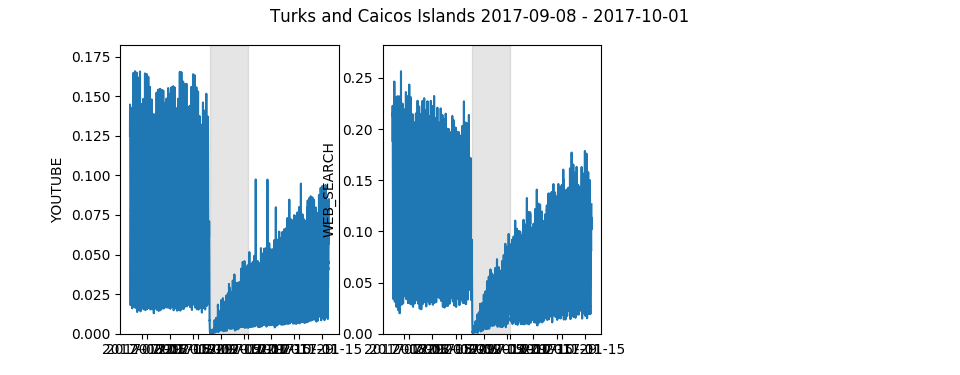

Turks and Caicos Islands (TC) 2017-09-08 2017-10-01 Context: https://www.google.com/search?q=internet+Turks+and+Caicos+Islands&tbs=cdr%3A1%2Ccd_min%3A09%2F08%2F2017%2Ccd_max%3A09%2F15%2F2017 https://twitter.com/search?q=internet+Turks+and+Caicos+Islands+since%3A2017-09-08+until%3A2017-09-15 https://metrics.torproject.org/userstats-relay-country.html?events=on&start=2017-07-22&end=2017-11-19&country=TC
    YOUTUBE, 2017-09-08, 2017-10-01, 19.133316, 1.230907, https://transparencyreport.google.com/traffic/overview?lu=fraction_traffic&fraction_traffic=product%3A21%3Bstart%3A1500696000000%3Bend%3A1511067600000%3Bregion%3ATC
    WEB_SEARCH, 2017-09-08, 2017-09-26, 12.916391, 1.440605, https://transparencyreport.google.com/traffic/overview?lu=fraction_traffic&fraction_traffic=product%3A19%3Bstart%3A1501560000000%3Bend%3A1509768000000%3Bregion%3ATC


<IPython.core.display.Javascript object>


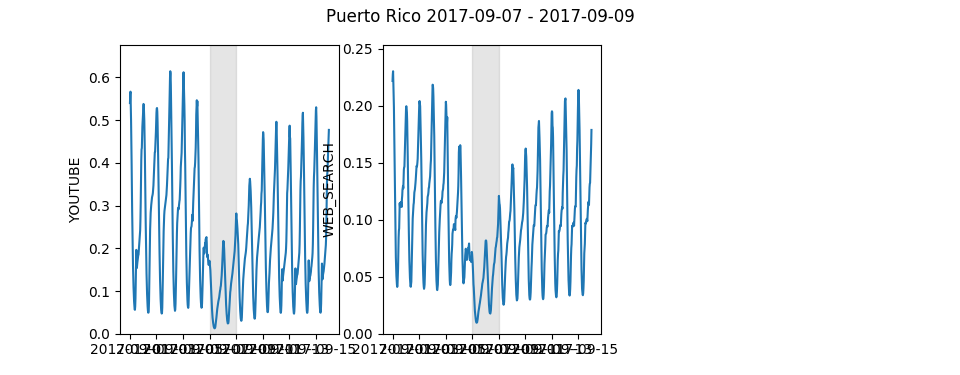

Puerto Rico (PR) 2017-09-07 2017-09-09 Context: https://www.google.com/search?q=internet+Puerto+Rico&tbs=cdr%3A1%2Ccd_min%3A09%2F07%2F2017%2Ccd_max%3A09%2F14%2F2017 https://twitter.com/search?q=internet+Puerto+Rico+since%3A2017-09-07+until%3A2017-09-14 https://metrics.torproject.org/userstats-relay-country.html?events=on&start=2017-09-01&end=2017-09-16&country=PR
    YOUTUBE, 2017-09-07, 2017-09-09, 1.626437, 0.440235, https://transparencyreport.google.com/traffic/overview?lu=fraction_traffic&fraction_traffic=product%3A21%3Bstart%3A1504238400000%3Bend%3A1505534400000%3Bregion%3APR
    WEB_SEARCH, 2017-09-07, 2017-09-08, 1.195677, 0.136977, https://transparencyreport.google.com/traffic/overview?lu=fraction_traffic&fraction_traffic=product%3A19%3Bstart%3A1504411200000%3Bend%3A1505275200000%3Bregion%3APR


<IPython.core.display.Javascript object>


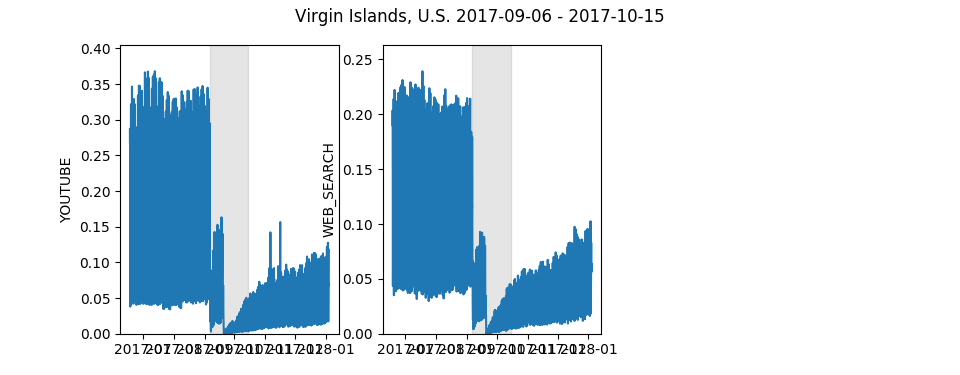

Virgin Islands, U.S. (VI) 2017-09-06 2017-10-15 Context: https://www.google.com/search?q=internet+Virgin+Islands%2C+U.S.&tbs=cdr%3A1%2Ccd_min%3A09%2F06%2F2017%2Ccd_max%3A09%2F13%2F2017 https://twitter.com/search?q=internet+Virgin+Islands%2C+U.S.+since%3A2017-09-06+until%3A2017-09-13 https://metrics.torproject.org/userstats-relay-country.html?events=on&start=2017-06-18&end=2018-01-04&country=VI
    YOUTUBE, 2017-09-06, 2017-10-15, 26.651761, 3.697107, https://transparencyreport.google.com/traffic/overview?lu=fraction_traffic&fraction_traffic=product%3A21%3Bstart%3A1497758400000%3Bend%3A1515042000000%3Bregion%3AVI
    WEB_SEARCH, 2017-09-06, 2017-10-10, 22.344752, 2.348232, https://transparencyreport.google.com/traffic/overview?lu=fraction_traffic&fraction_traffic=product%3A19%3Bstart%3A1498622400000%3Bend%3A1513746000000%3Bregion%3AVI


<IPython.core.display.Javascript object>


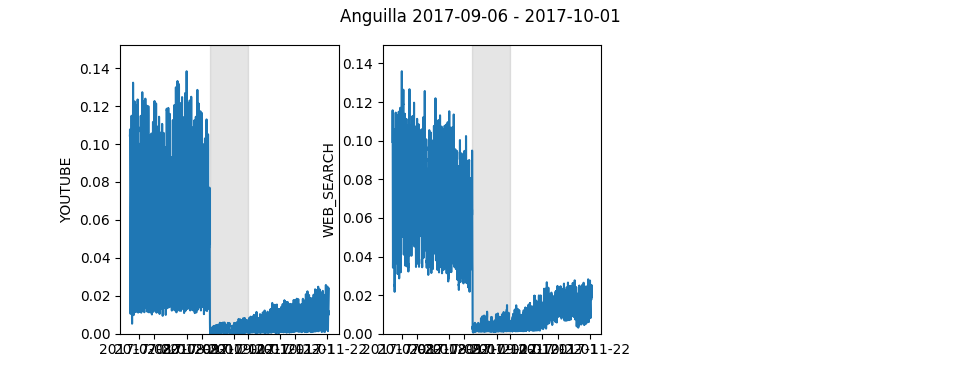

Anguilla (AI) 2017-09-06 2017-10-01 Context: https://www.google.com/search?q=internet+Anguilla&tbs=cdr%3A1%2Ccd_min%3A09%2F06%2F2017%2Ccd_max%3A09%2F13%2F2017 https://twitter.com/search?q=internet+Anguilla+since%3A2017-09-06+until%3A2017-09-13 https://metrics.torproject.org/userstats-relay-country.html?events=on&start=2017-07-16&end=2017-11-23&country=AI
    YOUTUBE, 2017-09-06, 2017-10-01, 18.510406, 1.149412, https://transparencyreport.google.com/traffic/overview?lu=fraction_traffic&fraction_traffic=product%3A21%3Bstart%3A1500177600000%3Bend%3A1511413200000%3Bregion%3AAI
    WEB_SEARCH, 2017-09-06, 2017-09-24, 13.514373, 0.958497, https://transparencyreport.google.com/traffic/overview?lu=fraction_traffic&fraction_traffic=product%3A19%3Bstart%3A1501387200000%3Bend%3A1509595200000%3Bregion%3AAI


<IPython.core.display.Javascript object>


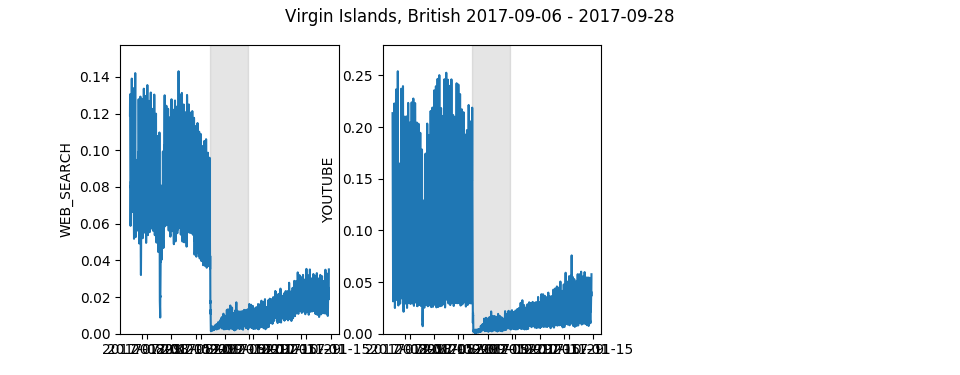

Virgin Islands, British (VG) 2017-09-06 2017-09-28 Context: https://www.google.com/search?q=internet+Virgin+Islands%2C+British&tbs=cdr%3A1%2Ccd_min%3A09%2F06%2F2017%2Ccd_max%3A09%2F13%2F2017 https://twitter.com/search?q=internet+Virgin+Islands%2C+British+since%3A2017-09-06+until%3A2017-09-13 https://metrics.torproject.org/userstats-relay-country.html?events=on&start=2017-07-22&end=2017-11-14&country=VG
    WEB_SEARCH, 2017-09-06, 2017-09-28, 17.661379, 1.218801, https://transparencyreport.google.com/traffic/overview?lu=fraction_traffic&fraction_traffic=product%3A19%3Bstart%3A1500696000000%3Bend%3A1510635600000%3Bregion%3AVG
    YOUTUBE, 2017-09-07, 2017-09-25, 16.276126, 1.661821, https://transparencyreport.google.com/traffic/overview?lu=fraction_traffic&fraction_traffic=product%3A21%3Bstart%3A1501473600000%3Bend%3A1509681600000%3Bregion%3AVG


<IPython.core.display.Javascript object>


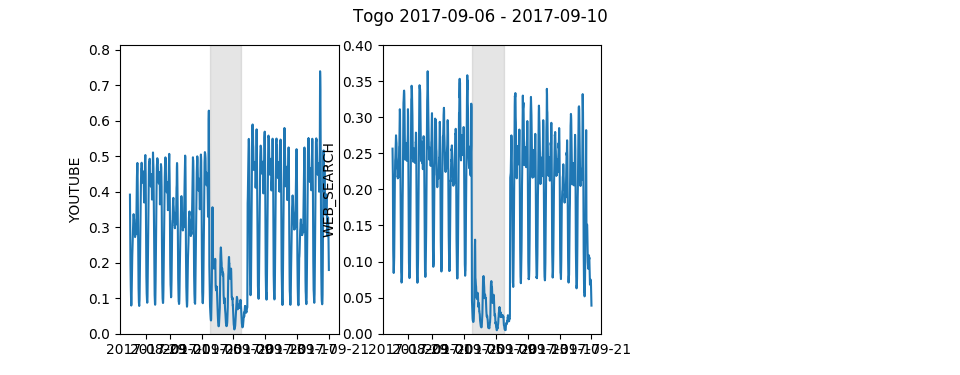

Togo (TG) 2017-09-06 2017-09-10 Context: https://www.google.com/search?q=internet+Togo&tbs=cdr%3A1%2Ccd_min%3A09%2F06%2F2017%2Ccd_max%3A09%2F13%2F2017 https://twitter.com/search?q=internet+Togo+since%3A2017-09-06+until%3A2017-09-13 https://metrics.torproject.org/userstats-relay-country.html?events=on&start=2017-08-27&end=2017-09-21&country=TG
    YOUTUBE, 2017-09-06, 2017-09-10, 3.231080, 0.872487, https://transparencyreport.google.com/traffic/overview?lu=fraction_traffic&fraction_traffic=product%3A21%3Bstart%3A1503806400000%3Bend%3A1505966400000%3Bregion%3ATG
    WEB_SEARCH, 2017-09-06, 2017-09-10, 5.426965, 0.875557, https://transparencyreport.google.com/traffic/overview?lu=fraction_traffic&fraction_traffic=product%3A19%3Bstart%3A1503806400000%3Bend%3A1505966400000%3Bregion%3ATG


<IPython.core.display.Javascript object>


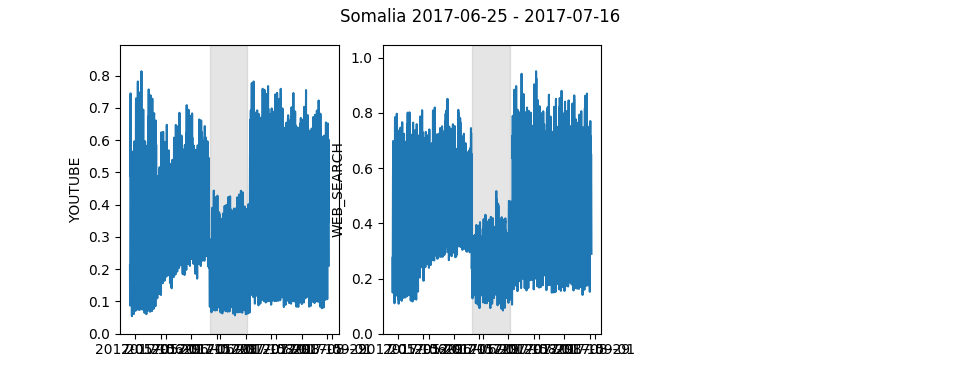

Somalia (SO) 2017-06-25 2017-07-16 Context: https://www.google.com/search?q=internet+Somalia&tbs=cdr%3A1%2Ccd_min%3A06%2F25%2F2017%2Ccd_max%3A07%2F02%2F2017 https://twitter.com/search?q=internet+Somalia+since%3A2017-06-25+until%3A2017-07-02 https://metrics.torproject.org/userstats-relay-country.html?events=on&start=2017-05-12&end=2017-08-30&country=SO
    YOUTUBE, 2017-06-25, 2017-07-13, 7.122440, 2.175206, https://transparencyreport.google.com/traffic/overview?lu=fraction_traffic&fraction_traffic=product%3A21%3Bstart%3A1495080000000%3Bend%3A1503288000000%3Bregion%3ASO
    WEB_SEARCH, 2017-06-25, 2017-07-16, 9.661436, 3.815515, https://transparencyreport.google.com/traffic/overview?lu=fraction_traffic&fraction_traffic=product%3A19%3Bstart%3A1494561600000%3Bend%3A1504065600000%3Bregion%3ASO


<IPython.core.display.Javascript object>


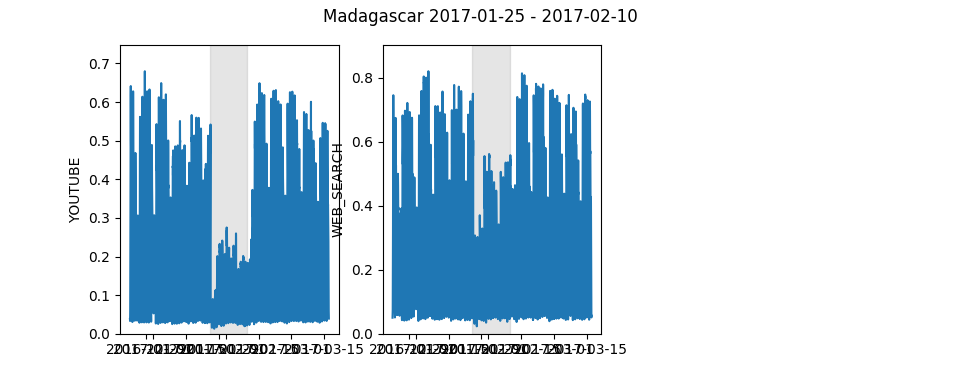

Madagascar (MG) 2017-01-25 2017-02-10 Context: https://www.google.com/search?q=internet+Madagascar&tbs=cdr%3A1%2Ccd_min%3A01%2F25%2F2017%2Ccd_max%3A02%2F01%2F2017 https://twitter.com/search?q=internet+Madagascar+since%3A2017-01-25+until%3A2017-02-01 https://metrics.torproject.org/userstats-relay-country.html?events=on&start=2016-12-22&end=2017-03-17&country=MG
    YOUTUBE, 2017-01-25, 2017-02-10, 6.589237, 1.946370, https://transparencyreport.google.com/traffic/overview?lu=fraction_traffic&fraction_traffic=product%3A21%3Bstart%3A1482382800000%3Bend%3A1489723200000%3Bregion%3AMG
    WEB_SEARCH, 2017-01-25, 2017-02-07, 2.936511, 0.998637, https://transparencyreport.google.com/traffic/overview?lu=fraction_traffic&fraction_traffic=product%3A19%3Bstart%3A1482901200000%3Bend%3A1488949200000%3Bregion%3AMG


<IPython.core.display.Javascript object>


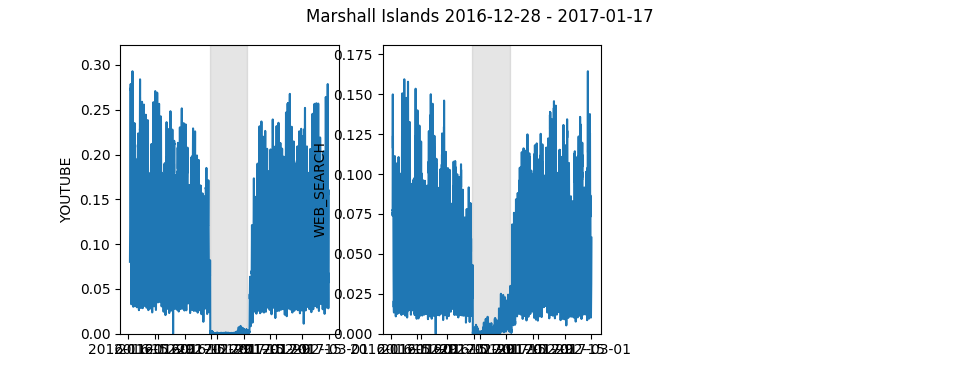

Marshall Islands (MH) 2016-12-28 2017-01-17 Context: https://www.google.com/search?q=internet+Marshall+Islands&tbs=cdr%3A1%2Ccd_min%3A12%2F28%2F2016%2Ccd_max%3A01%2F04%2F2017 https://twitter.com/search?q=internet+Marshall+Islands+since%3A2016-12-28+until%3A2017-01-04 https://metrics.torproject.org/userstats-relay-country.html?events=on&start=2016-11-16&end=2017-03-01&country=MH
    YOUTUBE, 2016-12-28, 2017-01-17, 17.727219, 2.098920, https://transparencyreport.google.com/traffic/overview?lu=fraction_traffic&fraction_traffic=product%3A21%3Bstart%3A1479272400000%3Bend%3A1488344400000%3Bregion%3AMH
    WEB_SEARCH, 2016-12-28, 2017-01-12, 12.442201, 0.734155, https://transparencyreport.google.com/traffic/overview?lu=fraction_traffic&fraction_traffic=product%3A19%3Bstart%3A1480136400000%3Bend%3A1487048400000%3Bregion%3AMH


<IPython.core.display.Javascript object>


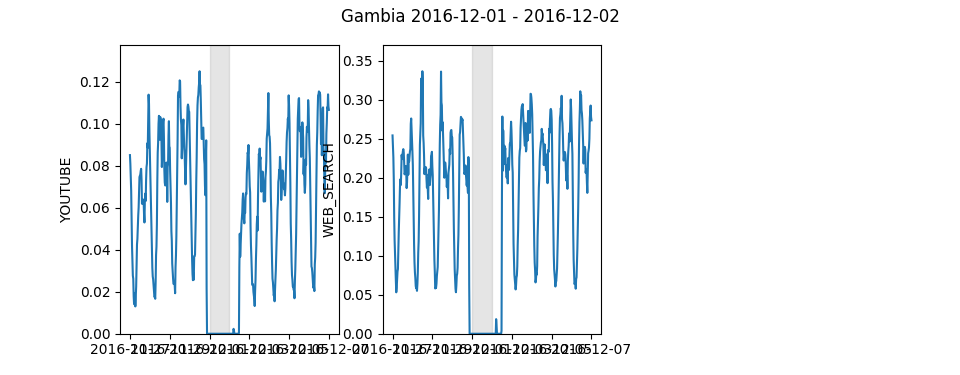

Gambia (GM) 2016-12-01 2016-12-02 Context: https://www.google.com/search?q=internet+Gambia&tbs=cdr%3A1%2Ccd_min%3A12%2F01%2F2016%2Ccd_max%3A12%2F08%2F2016 https://twitter.com/search?q=internet+Gambia+since%3A2016-12-01+until%3A2016-12-08 https://metrics.torproject.org/userstats-relay-country.html?events=on&start=2016-11-27&end=2016-12-07&country=GM
    YOUTUBE, 2016-12-01, 2016-12-02, 1.082598, 0.107572, https://transparencyreport.google.com/traffic/overview?lu=fraction_traffic&fraction_traffic=product%3A21%3Bstart%3A1480222800000%3Bend%3A1481086800000%3Bregion%3AGM
    WEB_SEARCH, 2016-12-01, 2016-12-02, 1.068617, 0.264414, https://transparencyreport.google.com/traffic/overview?lu=fraction_traffic&fraction_traffic=product%3A19%3Bstart%3A1480222800000%3Bend%3A1481086800000%3Bregion%3AGM


<IPython.core.display.Javascript object>


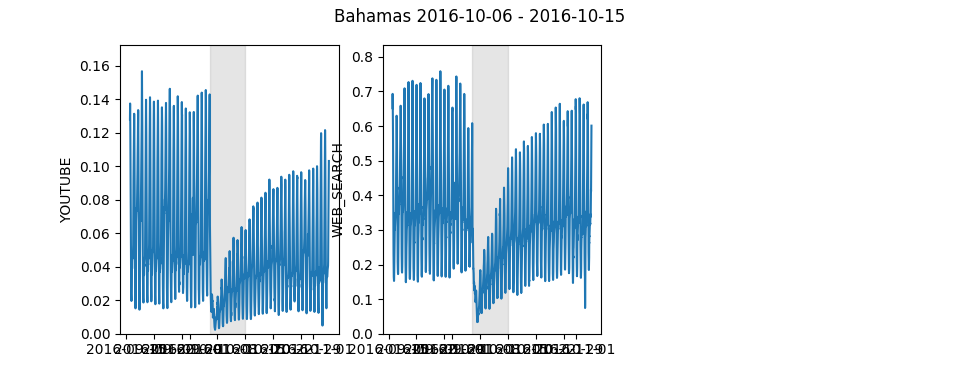

Bahamas (BS) 2016-10-06 2016-10-15 Context: https://www.google.com/search?q=internet+Bahamas&tbs=cdr%3A1%2Ccd_min%3A10%2F06%2F2016%2Ccd_max%3A10%2F13%2F2016 https://twitter.com/search?q=internet+Bahamas+since%3A2016-10-06+until%3A2016-10-13 https://metrics.torproject.org/userstats-relay-country.html?events=on&start=2016-09-16&end=2016-11-05&country=BS
    YOUTUBE, 2016-10-06, 2016-10-15, 5.702822, 0.401996, https://transparencyreport.google.com/traffic/overview?lu=fraction_traffic&fraction_traffic=product%3A21%3Bstart%3A1473998400000%3Bend%3A1478318400000%3Bregion%3ABS
    WEB_SEARCH, 2016-10-06, 2016-10-14, 4.467423, 1.662121, https://transparencyreport.google.com/traffic/overview?lu=fraction_traffic&fraction_traffic=product%3A19%3Bstart%3A1474171200000%3Bend%3A1478059200000%3Bregion%3ABS


<IPython.core.display.Javascript object>


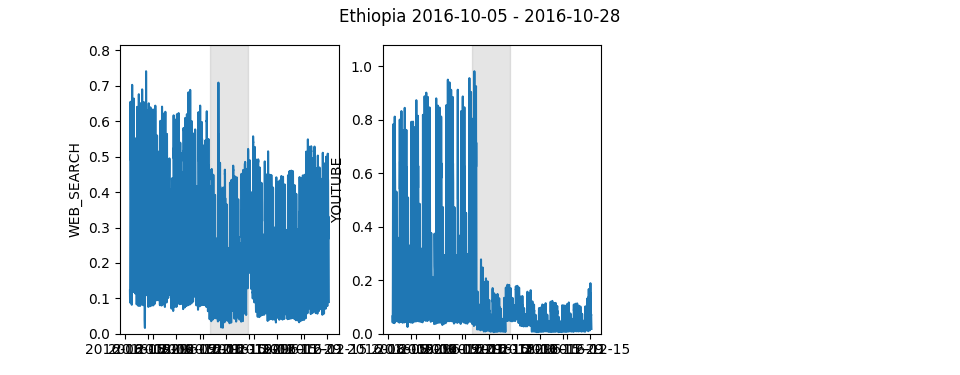

Ethiopia (ET) 2016-10-05 2016-10-28 Context: https://www.google.com/search?q=internet+Ethiopia&tbs=cdr%3A1%2Ccd_min%3A10%2F05%2F2016%2Ccd_max%3A10%2F12%2F2016 https://twitter.com/search?q=internet+Ethiopia+since%3A2016-10-05+until%3A2016-10-12 https://metrics.torproject.org/userstats-relay-country.html?events=on&start=2016-08-18&end=2016-12-16&country=ET
    WEB_SEARCH, 2016-10-05, 2016-10-16, 5.634202, 1.738828, https://transparencyreport.google.com/traffic/overview?lu=fraction_traffic&fraction_traffic=product%3A19%3Bstart%3A1473566400000%3Bend%3A1478754000000%3Bregion%3AET
    YOUTUBE, 2016-10-08, 2016-10-28, 14.147770, 3.546727, https://transparencyreport.google.com/traffic/overview?lu=fraction_traffic&fraction_traffic=product%3A21%3Bstart%3A1472270400000%3Bend%3A1481346000000%3Bregion%3AET


<IPython.core.display.Javascript object>


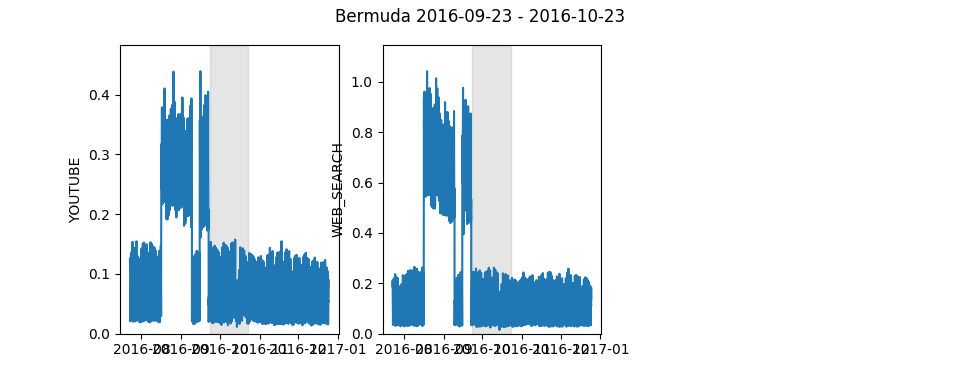

Bermuda (BM) 2016-09-23 2016-10-23 Context: https://www.google.com/search?q=internet+Bermuda&tbs=cdr%3A1%2Ccd_min%3A09%2F23%2F2016%2Ccd_max%3A09%2F30%2F2016 https://twitter.com/search?q=internet+Bermuda+since%3A2016-09-23+until%3A2016-09-30 https://metrics.torproject.org/userstats-relay-country.html?events=on&start=2016-07-23&end=2016-12-25&country=BM
    YOUTUBE, 2016-09-23, 2016-10-23, 44.716102, 3.084585, https://transparencyreport.google.com/traffic/overview?lu=fraction_traffic&fraction_traffic=product%3A21%3Bstart%3A1469246400000%3Bend%3A1482642000000%3Bregion%3ABM
    WEB_SEARCH, 2016-09-23, 2016-10-21, 62.422974, 8.174926, https://transparencyreport.google.com/traffic/overview?lu=fraction_traffic&fraction_traffic=product%3A19%3Bstart%3A1469592000000%3Bend%3A1482123600000%3Bregion%3ABM


<IPython.core.display.Javascript object>


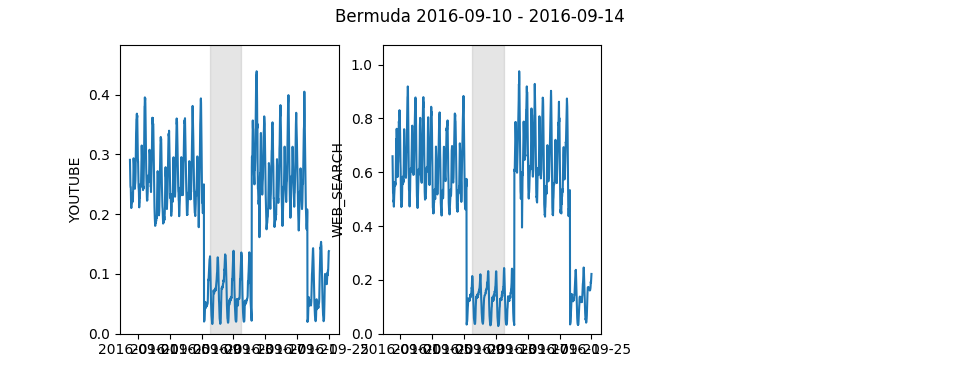

Bermuda (BM) 2016-09-10 2016-09-14 Context: https://www.google.com/search?q=internet+Bermuda&tbs=cdr%3A1%2Ccd_min%3A09%2F10%2F2016%2Ccd_max%3A09%2F17%2F2016 https://twitter.com/search?q=internet+Bermuda+since%3A2016-09-10+until%3A2016-09-17 https://metrics.torproject.org/userstats-relay-country.html?events=on&start=2016-08-31&end=2016-09-25&country=BM
    YOUTUBE, 2016-09-10, 2016-09-14, 6.334139, 0.436939, https://transparencyreport.google.com/traffic/overview?lu=fraction_traffic&fraction_traffic=product%3A21%3Bstart%3A1472616000000%3Bend%3A1474776000000%3Bregion%3ABM
    WEB_SEARCH, 2016-09-10, 2016-09-14, 8.647220, 1.132442, https://transparencyreport.google.com/traffic/overview?lu=fraction_traffic&fraction_traffic=product%3A19%3Bstart%3A1472616000000%3Bend%3A1474776000000%3Bregion%3ABM


<IPython.core.display.Javascript object>


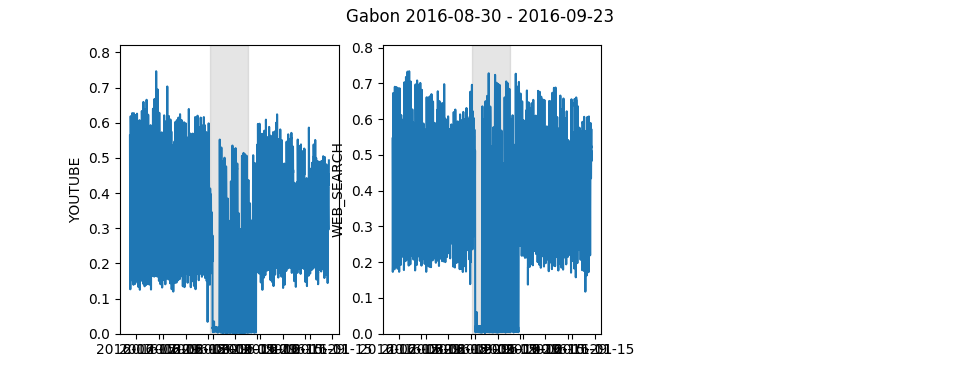

Gabon (GA) 2016-08-30 2016-09-23 Context: https://www.google.com/search?q=internet+Gabon&tbs=cdr%3A1%2Ccd_min%3A08%2F30%2F2016%2Ccd_max%3A09%2F06%2F2016 https://twitter.com/search?q=internet+Gabon+since%3A2016-08-30+until%3A2016-09-06 https://metrics.torproject.org/userstats-relay-country.html?events=on&start=2016-07-11&end=2016-11-13&country=GA
    YOUTUBE, 2016-08-30, 2016-09-23, 12.889093, 4.712073, https://transparencyreport.google.com/traffic/overview?lu=fraction_traffic&fraction_traffic=product%3A21%3Bstart%3A1468209600000%3Bend%3A1479013200000%3Bregion%3AGA
    WEB_SEARCH, 2016-09-01, 2016-09-18, 7.384568, 3.025061, https://transparencyreport.google.com/traffic/overview?lu=fraction_traffic&fraction_traffic=product%3A19%3Bstart%3A1469592000000%3Bend%3A1477368000000%3Bregion%3AGA


<IPython.core.display.Javascript object>


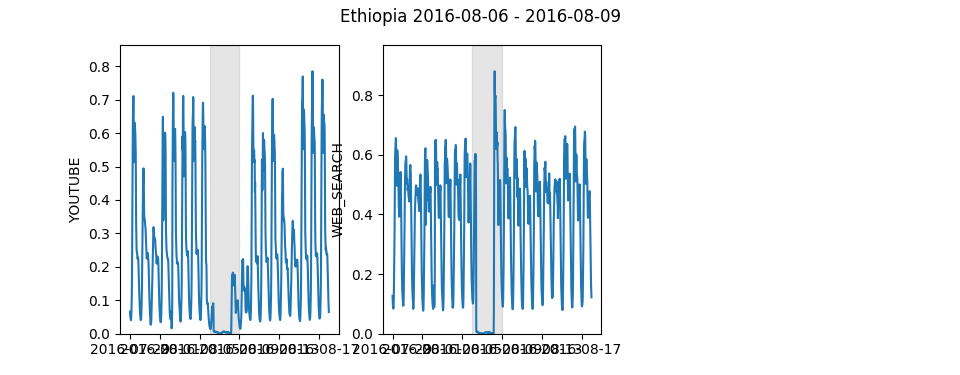

Ethiopia (ET) 2016-08-06 2016-08-09 Context: https://www.google.com/search?q=internet+Ethiopia&tbs=cdr%3A1%2Ccd_min%3A08%2F06%2F2016%2Ccd_max%3A08%2F13%2F2016 https://twitter.com/search?q=internet+Ethiopia+since%3A2016-08-06+until%3A2016-08-13 https://metrics.torproject.org/userstats-relay-country.html?events=on&start=2016-07-29&end=2016-08-18&country=ET
    YOUTUBE, 2016-08-06, 2016-08-09, 2.902301, 0.727582, https://transparencyreport.google.com/traffic/overview?lu=fraction_traffic&fraction_traffic=product%3A21%3Bstart%3A1469764800000%3Bend%3A1471492800000%3Bregion%3AET
    WEB_SEARCH, 2016-08-06, 2016-08-07, 1.899074, 0.586093, https://transparencyreport.google.com/traffic/overview?lu=fraction_traffic&fraction_traffic=product%3A19%3Bstart%3A1470110400000%3Bend%3A1470974400000%3Bregion%3AET


<IPython.core.display.Javascript object>


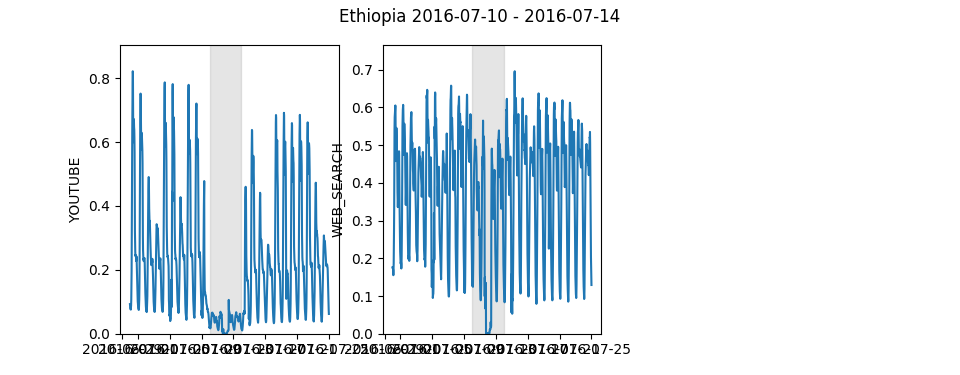

Ethiopia (ET) 2016-07-10 2016-07-14 Context: https://www.google.com/search?q=internet+Ethiopia&tbs=cdr%3A1%2Ccd_min%3A07%2F10%2F2016%2Ccd_max%3A07%2F17%2F2016 https://twitter.com/search?q=internet+Ethiopia+since%3A2016-07-10+until%3A2016-07-17 https://metrics.torproject.org/userstats-relay-country.html?events=on&start=2016-06-30&end=2016-07-25&country=ET
    YOUTUBE, 2016-07-10, 2016-07-14, 4.857482, 1.217730, https://transparencyreport.google.com/traffic/overview?lu=fraction_traffic&fraction_traffic=product%3A21%3Bstart%3A1467259200000%3Bend%3A1469419200000%3Bregion%3AET
    WEB_SEARCH, 2016-07-11, 2016-07-12, 1.158968, 0.357681, https://transparencyreport.google.com/traffic/overview?lu=fraction_traffic&fraction_traffic=product%3A19%3Bstart%3A1467864000000%3Bend%3A1468728000000%3Bregion%3AET


<IPython.core.display.Javascript object>


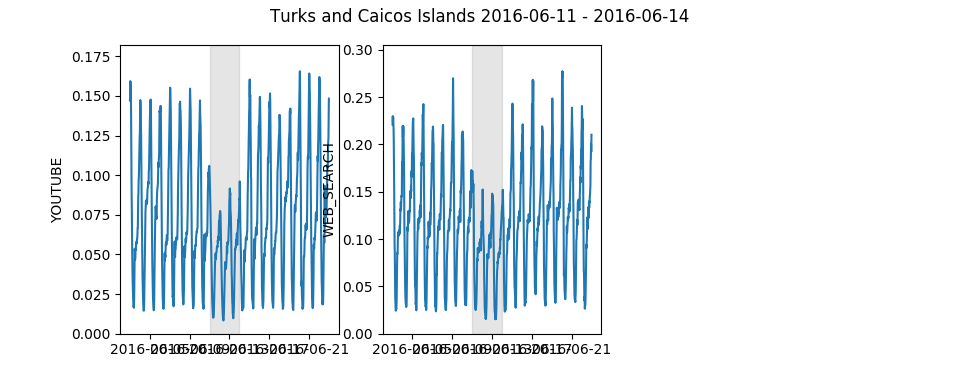

Turks and Caicos Islands (TC) 2016-06-11 2016-06-14 Context: https://www.google.com/search?q=internet+Turks+and+Caicos+Islands&tbs=cdr%3A1%2Ccd_min%3A06%2F11%2F2016%2Ccd_max%3A06%2F18%2F2016 https://twitter.com/search?q=internet+Turks+and+Caicos+Islands+since%3A2016-06-11+until%3A2016-06-18 https://metrics.torproject.org/userstats-relay-country.html?events=on&start=2016-06-03&end=2016-06-23&country=TC
    YOUTUBE, 2016-06-11, 2016-06-12, 1.126606, 0.072478, https://transparencyreport.google.com/traffic/overview?lu=fraction_traffic&fraction_traffic=product%3A21%3Bstart%3A1465272000000%3Bend%3A1466136000000%3Bregion%3ATC
    WEB_SEARCH, 2016-06-11, 2016-06-14, 2.372518, 0.264614, https://transparencyreport.google.com/traffic/overview?lu=fraction_traffic&fraction_traffic=product%3A19%3Bstart%3A1464926400000%3Bend%3A1466654400000%3Bregion%3ATC


<IPython.core.display.Javascript object>


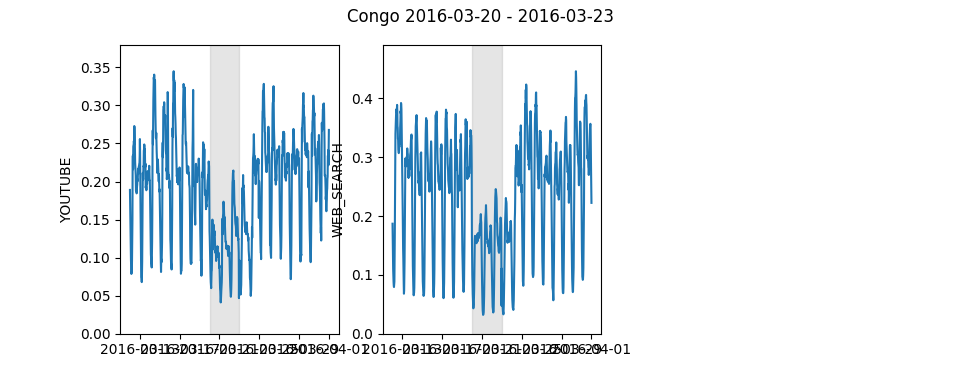

Congo (CG) 2016-03-20 2016-03-23 Context: https://www.google.com/search?q=internet+Congo&tbs=cdr%3A1%2Ccd_min%3A03%2F20%2F2016%2Ccd_max%3A03%2F27%2F2016 https://twitter.com/search?q=internet+Congo+since%3A2016-03-20+until%3A2016-03-27 https://metrics.torproject.org/userstats-relay-country.html?events=on&start=2016-03-12&end=2016-04-01&country=CG
    YOUTUBE, 2016-03-20, 2016-03-23, 2.562987, 0.371530, https://transparencyreport.google.com/traffic/overview?lu=fraction_traffic&fraction_traffic=product%3A21%3Bstart%3A1457758800000%3Bend%3A1459483200000%3Bregion%3ACG
    WEB_SEARCH, 2016-03-20, 2016-03-23, 2.617263, 0.397442, https://transparencyreport.google.com/traffic/overview?lu=fraction_traffic&fraction_traffic=product%3A19%3Bstart%3A1457758800000%3Bend%3A1459483200000%3Bregion%3ACG


<IPython.core.display.Javascript object>


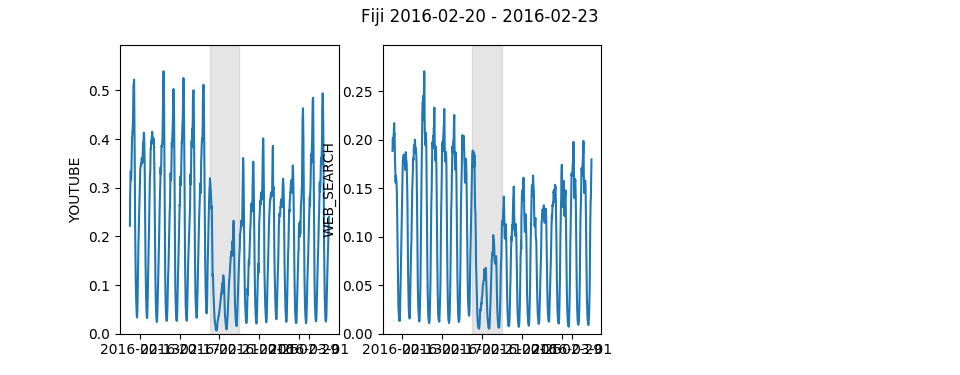

Fiji (FJ) 2016-02-20 2016-02-23 Context: https://www.google.com/search?q=internet+Fiji&tbs=cdr%3A1%2Ccd_min%3A02%2F20%2F2016%2Ccd_max%3A02%2F27%2F2016 https://twitter.com/search?q=internet+Fiji+since%3A2016-02-20+until%3A2016-02-27 https://metrics.torproject.org/userstats-relay-country.html?events=on&start=2016-02-12&end=2016-03-03&country=FJ
    YOUTUBE, 2016-02-20, 2016-02-23, 1.652873, 0.503419, https://transparencyreport.google.com/traffic/overview?lu=fraction_traffic&fraction_traffic=product%3A21%3Bstart%3A1455253200000%3Bend%3A1456981200000%3Bregion%3AFJ
    WEB_SEARCH, 2016-02-21, 2016-02-23, 1.326649, 0.166718, https://transparencyreport.google.com/traffic/overview?lu=fraction_traffic&fraction_traffic=product%3A19%3Bstart%3A1455512400000%3Bend%3A1456808400000%3Bregion%3AFJ


<IPython.core.display.Javascript object>


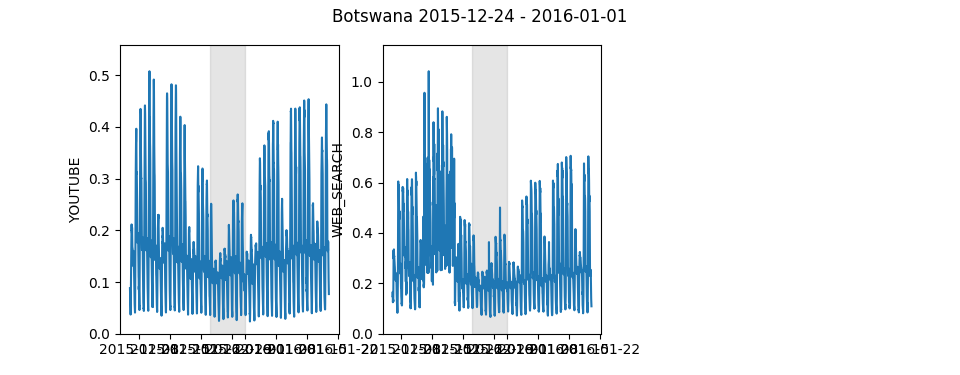

Botswana (BW) 2015-12-24 2016-01-01 Context: https://www.google.com/search?q=internet+Botswana&tbs=cdr%3A1%2Ccd_min%3A12%2F24%2F2015%2Ccd_max%3A12%2F31%2F2015 https://twitter.com/search?q=internet+Botswana+since%3A2015-12-24+until%3A2015-12-31 https://metrics.torproject.org/userstats-relay-country.html?events=on&start=2015-12-06&end=2016-01-20&country=BW
    YOUTUBE, 2015-12-24, 2016-01-01, 2.259531, 0.444191, https://transparencyreport.google.com/traffic/overview?lu=fraction_traffic&fraction_traffic=product%3A21%3Bstart%3A1449378000000%3Bend%3A1453266000000%3Bregion%3ABW
    WEB_SEARCH, 2015-12-24, 2016-01-01, 3.227820, 0.998732, https://transparencyreport.google.com/traffic/overview?lu=fraction_traffic&fraction_traffic=product%3A19%3Bstart%3A1449378000000%3Bend%3A1453266000000%3Bregion%3ABW


<IPython.core.display.Javascript object>


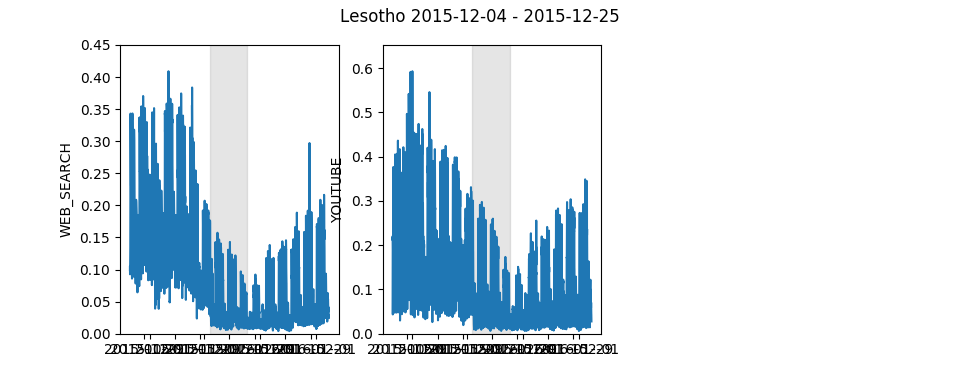

Lesotho (LS) 2015-12-04 2015-12-25 Context: https://www.google.com/search?q=internet+Lesotho&tbs=cdr%3A1%2Ccd_min%3A12%2F04%2F2015%2Ccd_max%3A12%2F11%2F2015 https://twitter.com/search?q=internet+Lesotho+since%3A2015-12-04+until%3A2015-12-11 https://metrics.torproject.org/userstats-relay-country.html?events=on&start=2015-10-21&end=2016-02-08&country=LS
    WEB_SEARCH, 2015-12-04, 2015-12-25, 10.712876, 2.077959, https://transparencyreport.google.com/traffic/overview?lu=fraction_traffic&fraction_traffic=product%3A19%3Bstart%3A1445400000000%3Bend%3A1454907600000%3Bregion%3ALS
    YOUTUBE, 2015-12-16, 2015-12-25, 4.840467, 0.904285, https://transparencyreport.google.com/traffic/overview?lu=fraction_traffic&fraction_traffic=product%3A21%3Bstart%3A1448514000000%3Bend%3A1452834000000%3Bregion%3ALS


<IPython.core.display.Javascript object>


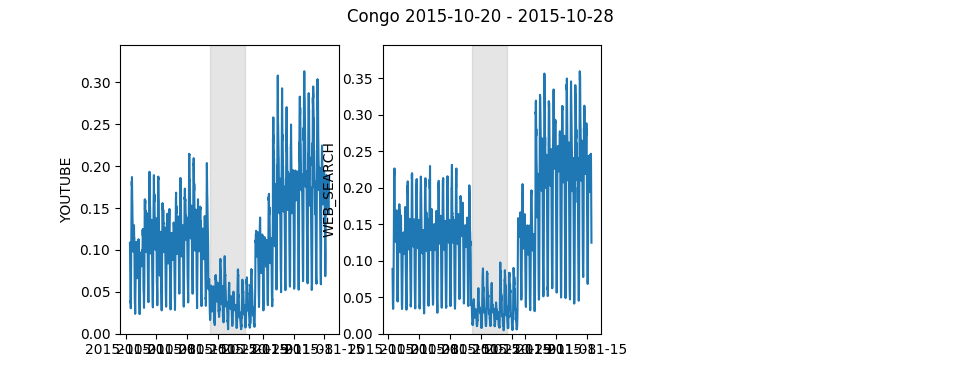

Congo (CG) 2015-10-20 2015-10-28 Context: https://www.google.com/search?q=internet+Congo&tbs=cdr%3A1%2Ccd_min%3A10%2F20%2F2015%2Ccd_max%3A10%2F27%2F2015 https://twitter.com/search?q=internet+Congo+since%3A2015-10-20+until%3A2015-10-27 https://metrics.torproject.org/userstats-relay-country.html?events=on&start=2015-10-02&end=2015-11-16&country=CG
    YOUTUBE, 2015-10-20, 2015-10-28, 3.801402, 0.551051, https://transparencyreport.google.com/traffic/overview?lu=fraction_traffic&fraction_traffic=product%3A21%3Bstart%3A1443758400000%3Bend%3A1447650000000%3Bregion%3ACG
    WEB_SEARCH, 2015-10-20, 2015-10-24, 1.926327, 0.292521, https://transparencyreport.google.com/traffic/overview?lu=fraction_traffic&fraction_traffic=product%3A19%3Bstart%3A1444449600000%3Bend%3A1446613200000%3Bregion%3ACG


<IPython.core.display.Javascript object>


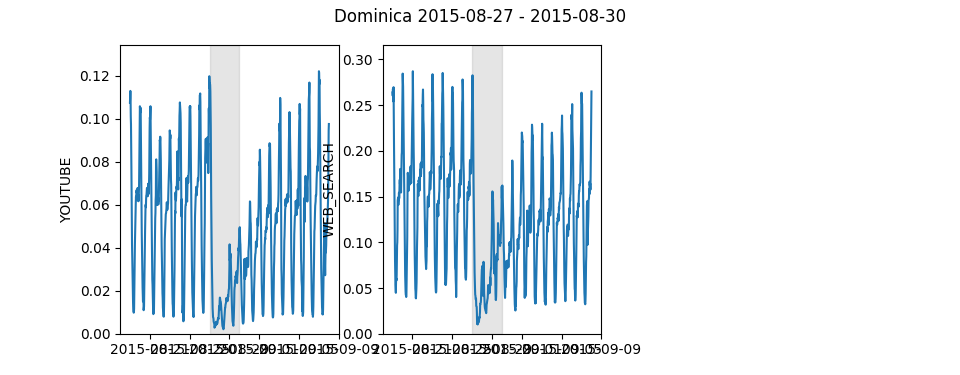

Dominica (DM) 2015-08-27 2015-08-30 Context: https://www.google.com/search?q=internet+Dominica&tbs=cdr%3A1%2Ccd_min%3A08%2F27%2F2015%2Ccd_max%3A09%2F03%2F2015 https://twitter.com/search?q=internet+Dominica+since%3A2015-08-27+until%3A2015-09-03 https://metrics.torproject.org/userstats-relay-country.html?events=on&start=2015-08-19&end=2015-09-08&country=DM
    YOUTUBE, 2015-08-27, 2015-08-30, 3.175397, 0.137078, https://transparencyreport.google.com/traffic/overview?lu=fraction_traffic&fraction_traffic=product%3A21%3Bstart%3A1439956800000%3Bend%3A1441684800000%3Bregion%3ADM
    WEB_SEARCH, 2015-08-27, 2015-08-30, 2.724424, 0.320669, https://transparencyreport.google.com/traffic/overview?lu=fraction_traffic&fraction_traffic=product%3A19%3Bstart%3A1439956800000%3Bend%3A1441684800000%3Bregion%3ADM


<IPython.core.display.Javascript object>


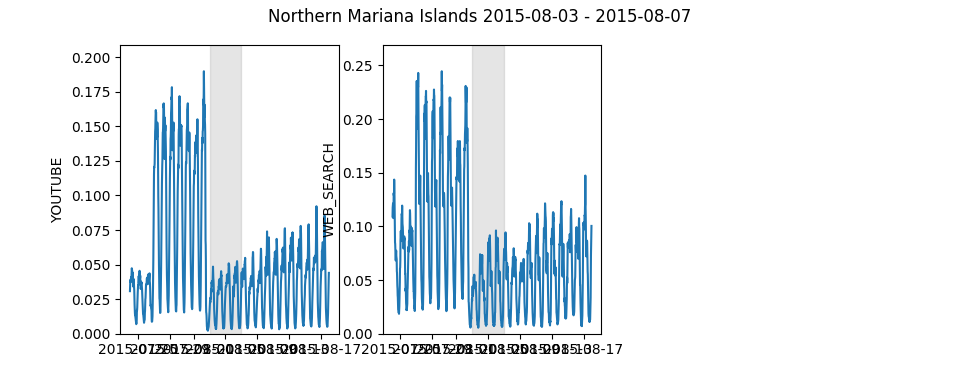

Northern Mariana Islands (MP) 2015-08-03 2015-08-07 Context: https://www.google.com/search?q=internet+Northern+Mariana+Islands&tbs=cdr%3A1%2Ccd_min%3A08%2F03%2F2015%2Ccd_max%3A08%2F10%2F2015 https://twitter.com/search?q=internet+Northern+Mariana+Islands+since%3A2015-08-03+until%3A2015-08-10 https://metrics.torproject.org/userstats-relay-country.html?events=on&start=2015-07-24&end=2015-08-18&country=MP
    YOUTUBE, 2015-08-03, 2015-08-07, 2.234797, 0.227356, https://transparencyreport.google.com/traffic/overview?lu=fraction_traffic&fraction_traffic=product%3A21%3Bstart%3A1437710400000%3Bend%3A1439870400000%3Bregion%3AMP
    WEB_SEARCH, 2015-08-03, 2015-08-06, 2.091405, 0.256243, https://transparencyreport.google.com/traffic/overview?lu=fraction_traffic&fraction_traffic=product%3A19%3Bstart%3A1437883200000%3Bend%3A1439611200000%3Bregion%3AMP


<IPython.core.display.Javascript object>


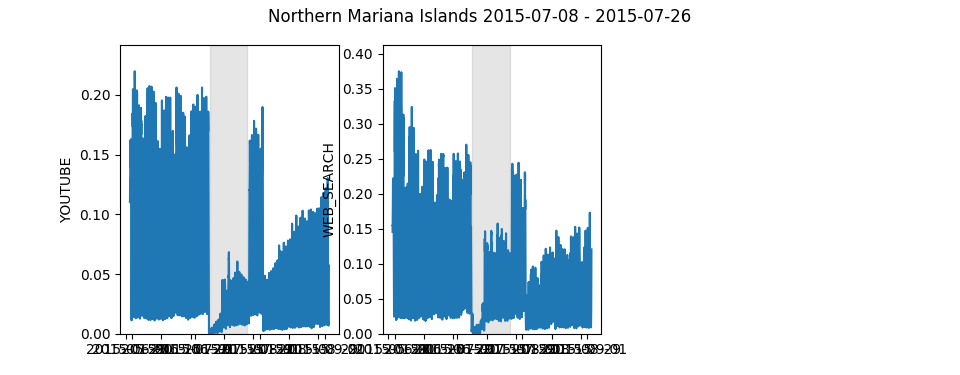

Northern Mariana Islands (MP) 2015-07-08 2015-07-26 Context: https://www.google.com/search?q=internet+Northern+Mariana+Islands&tbs=cdr%3A1%2Ccd_min%3A07%2F08%2F2015%2Ccd_max%3A07%2F15%2F2015 https://twitter.com/search?q=internet+Northern+Mariana+Islands+since%3A2015-07-08+until%3A2015-07-15 https://metrics.torproject.org/userstats-relay-country.html?events=on&start=2015-05-31&end=2015-09-03&country=MP
    YOUTUBE, 2015-07-08, 2015-07-26, 12.314882, 1.252847, https://transparencyreport.google.com/traffic/overview?lu=fraction_traffic&fraction_traffic=product%3A21%3Bstart%3A1433044800000%3Bend%3A1441252800000%3Bregion%3AMP
    WEB_SEARCH, 2015-07-08, 2015-07-16, 6.826507, 0.836396, https://transparencyreport.google.com/traffic/overview?lu=fraction_traffic&fraction_traffic=product%3A19%3Bstart%3A1434772800000%3Bend%3A1438660800000%3Bregion%3AMP


<IPython.core.display.Javascript object>


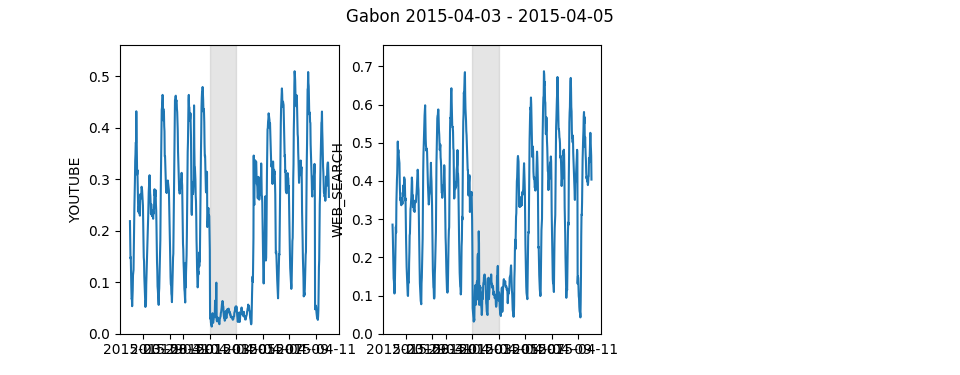

Gabon (GA) 2015-04-03 2015-04-05 Context: https://www.google.com/search?q=internet+Gabon&tbs=cdr%3A1%2Ccd_min%3A04%2F03%2F2015%2Ccd_max%3A04%2F10%2F2015 https://twitter.com/search?q=internet+Gabon+since%3A2015-04-03+until%3A2015-04-10 https://metrics.torproject.org/userstats-relay-country.html?events=on&start=2015-03-28&end=2015-04-12&country=GA
    YOUTUBE, 2015-04-03, 2015-04-05, 1.732203, 0.633269, https://transparencyreport.google.com/traffic/overview?lu=fraction_traffic&fraction_traffic=product%3A21%3Bstart%3A1427515200000%3Bend%3A1428811200000%3Bregion%3AGA
    WEB_SEARCH, 2015-04-03, 2015-04-05, 1.548561, 0.634362, https://transparencyreport.google.com/traffic/overview?lu=fraction_traffic&fraction_traffic=product%3A19%3Bstart%3A1427515200000%3Bend%3A1428811200000%3Bregion%3AGA


<IPython.core.display.Javascript object>


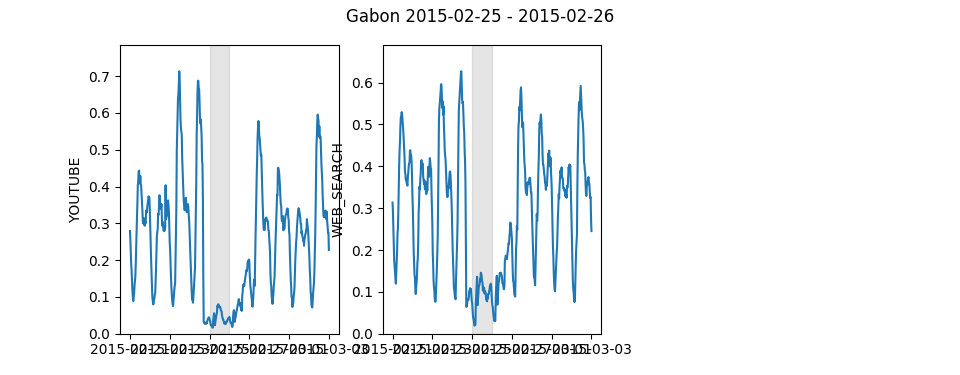

Gabon (GA) 2015-02-25 2015-02-26 Context: https://www.google.com/search?q=internet+Gabon&tbs=cdr%3A1%2Ccd_min%3A02%2F25%2F2015%2Ccd_max%3A03%2F04%2F2015 https://twitter.com/search?q=internet+Gabon+since%3A2015-02-25+until%3A2015-03-04 https://metrics.torproject.org/userstats-relay-country.html?events=on&start=2015-02-21&end=2015-03-03&country=GA
    YOUTUBE, 2015-02-25, 2015-02-26, 1.294131, 0.473116, https://transparencyreport.google.com/traffic/overview?lu=fraction_traffic&fraction_traffic=product%3A21%3Bstart%3A1424494800000%3Bend%3A1425358800000%3Bregion%3AGA
    WEB_SEARCH, 2015-02-25, 2015-02-26, 1.161544, 0.475822, https://transparencyreport.google.com/traffic/overview?lu=fraction_traffic&fraction_traffic=product%3A19%3Bstart%3A1424494800000%3Bend%3A1425358800000%3Bregion%3AGA


<IPython.core.display.Javascript object>


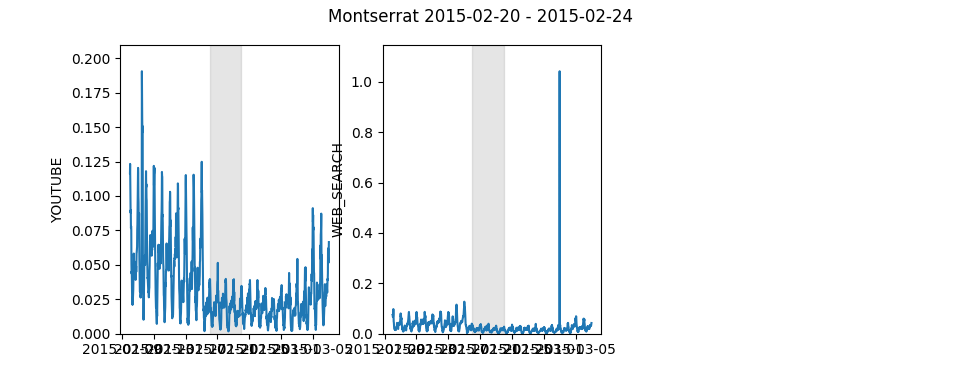

Montserrat (MS) 2015-02-20 2015-02-24 Context: https://www.google.com/search?q=internet+Montserrat&tbs=cdr%3A1%2Ccd_min%3A02%2F20%2F2015%2Ccd_max%3A02%2F27%2F2015 https://twitter.com/search?q=internet+Montserrat+since%3A2015-02-20+until%3A2015-02-27 https://metrics.torproject.org/userstats-relay-country.html?events=on&start=2015-02-10&end=2015-03-07&country=MS
    YOUTUBE, 2015-02-20, 2015-02-23, 2.495948, 0.115639, https://transparencyreport.google.com/traffic/overview?lu=fraction_traffic&fraction_traffic=product%3A21%3Bstart%3A1423717200000%3Bend%3A1425445200000%3Bregion%3AMS
    WEB_SEARCH, 2015-02-21, 2015-02-24, 2.960664, 0.098517, https://transparencyreport.google.com/traffic/overview?lu=fraction_traffic&fraction_traffic=product%3A19%3Bstart%3A1423803600000%3Bend%3A1425531600000%3Bregion%3AMS


<IPython.core.display.Javascript object>


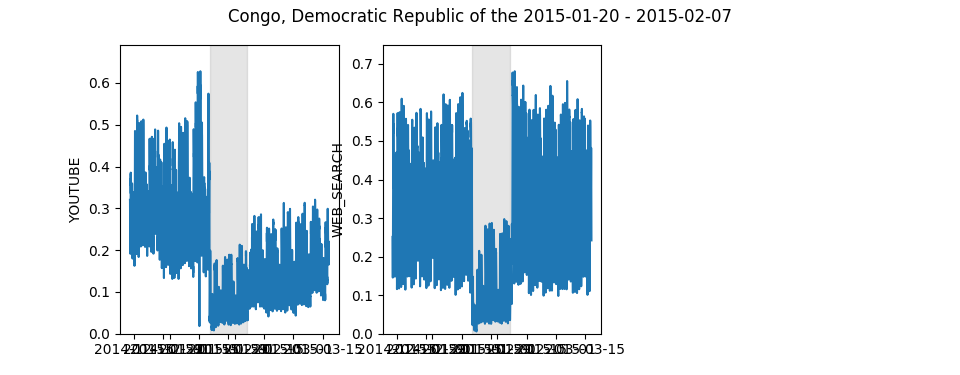

Congo, Democratic Republic of the (CD) 2015-01-20 2015-02-07 Context: https://www.google.com/search?q=internet+Congo%2C+Democratic+Republic+of+the&tbs=cdr%3A1%2Ccd_min%3A01%2F20%2F2015%2Ccd_max%3A01%2F27%2F2015 https://twitter.com/search?q=internet+Congo%2C+Democratic+Republic+of+the+since%3A2015-01-20+until%3A2015-01-27 https://metrics.torproject.org/userstats-relay-country.html?events=on&start=2014-12-13&end=2015-03-18&country=CD
    YOUTUBE, 2015-01-20, 2015-01-31, 8.467635, 2.509465, https://transparencyreport.google.com/traffic/overview?lu=fraction_traffic&fraction_traffic=product%3A21%3Bstart%3A1419656400000%3Bend%3A1424840400000%3Bregion%3ACD
    WEB_SEARCH, 2015-01-20, 2015-02-07, 10.362716, 3.731821, https://transparencyreport.google.com/traffic/overview?lu=fraction_traffic&fraction_traffic=product%3A19%3Bstart%3A1418446800000%3Bend%3A1426651200000%3Bregion%3ACD


<IPython.core.display.Javascript object>


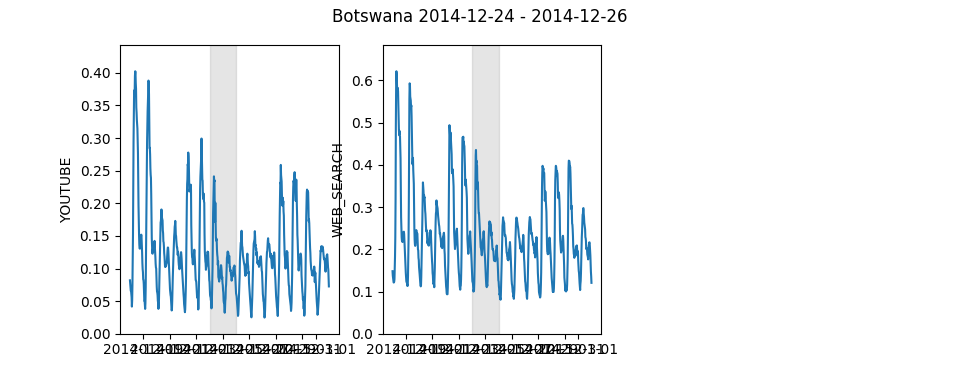

Botswana (BW) 2014-12-24 2014-12-26 Context: https://www.google.com/search?q=internet+Botswana&tbs=cdr%3A1%2Ccd_min%3A12%2F24%2F2014%2Ccd_max%3A12%2F31%2F2014 https://twitter.com/search?q=internet+Botswana+since%3A2014-12-24+until%3A2014-12-31 https://metrics.torproject.org/userstats-relay-country.html?events=on&start=2014-12-18&end=2015-01-02&country=BW
    YOUTUBE, 2014-12-24, 2014-12-26, 1.432614, 0.281631, https://transparencyreport.google.com/traffic/overview?lu=fraction_traffic&fraction_traffic=product%3A21%3Bstart%3A1418878800000%3Bend%3A1420174800000%3Bregion%3ABW
    WEB_SEARCH, 2014-12-24, 2014-12-26, 1.480236, 0.458005, https://transparencyreport.google.com/traffic/overview?lu=fraction_traffic&fraction_traffic=product%3A19%3Bstart%3A1418878800000%3Bend%3A1420174800000%3Bregion%3ABW


<IPython.core.display.Javascript object>


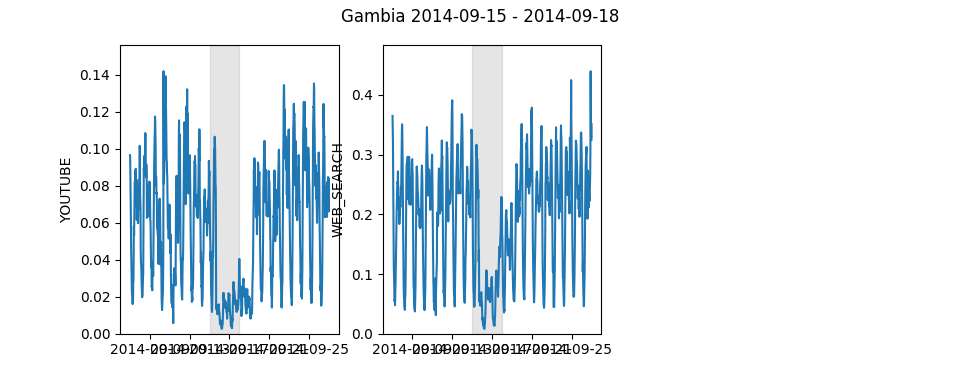

Gambia (GM) 2014-09-15 2014-09-18 Context: https://www.google.com/search?q=internet+Gambia&tbs=cdr%3A1%2Ccd_min%3A09%2F15%2F2014%2Ccd_max%3A09%2F22%2F2014 https://twitter.com/search?q=internet+Gambia+since%3A2014-09-15+until%3A2014-09-22 https://metrics.torproject.org/userstats-relay-country.html?events=on&start=2014-09-07&end=2014-09-27&country=GM
    YOUTUBE, 2014-09-15, 2014-09-18, 2.217803, 0.220372, https://transparencyreport.google.com/traffic/overview?lu=fraction_traffic&fraction_traffic=product%3A21%3Bstart%3A1410062400000%3Bend%3A1411790400000%3Bregion%3AGM
    WEB_SEARCH, 2014-09-15, 2014-09-18, 1.769377, 0.437808, https://transparencyreport.google.com/traffic/overview?lu=fraction_traffic&fraction_traffic=product%3A19%3Bstart%3A1410062400000%3Bend%3A1411790400000%3Bregion%3AGM


In [9]:
internet_shutdowns = [rd for rd in all_disruptions if len(rd.product_disruptions) >= 2]
print("Found %s shutdowns" % len(internet_shutdowns))

for region_disruption in internet_shutdowns:
    show_disruption(region_disruption)
    fa.print_disruption_csv(region_disruption)

## Outages for a country

Below are all the outages detected in Ethiopia

<IPython.core.display.Javascript object>


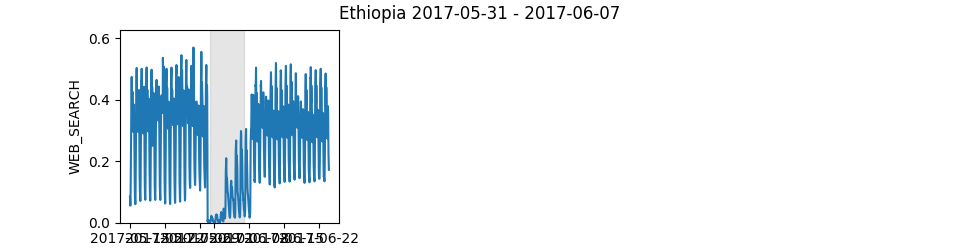

Ethiopia (ET) 2017-05-31 2017-06-07 Context: https://www.google.com/search?q=internet+Ethiopia&tbs=cdr%3A1%2Ccd_min%3A05%2F31%2F2017%2Ccd_max%3A06%2F07%2F2017 https://twitter.com/search?q=internet+Ethiopia+since%3A2017-05-31+until%3A2017-06-07 https://metrics.torproject.org/userstats-relay-country.html?events=on&start=2017-05-15&end=2017-06-24&country=ET
    WEB_SEARCH, 2017-05-31, 2017-06-07, 5.233837, 1.615268, https://transparencyreport.google.com/traffic/overview?lu=fraction_traffic&fraction_traffic=product%3A19%3Bstart%3A1494820800000%3Bend%3A1498276800000%3Bregion%3AET


<IPython.core.display.Javascript object>


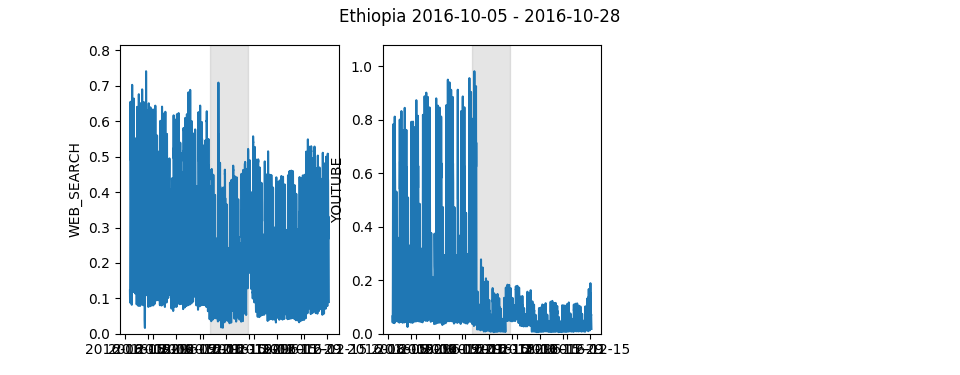

Ethiopia (ET) 2016-10-05 2016-10-28 Context: https://www.google.com/search?q=internet+Ethiopia&tbs=cdr%3A1%2Ccd_min%3A10%2F05%2F2016%2Ccd_max%3A10%2F12%2F2016 https://twitter.com/search?q=internet+Ethiopia+since%3A2016-10-05+until%3A2016-10-12 https://metrics.torproject.org/userstats-relay-country.html?events=on&start=2016-08-18&end=2016-12-16&country=ET
    WEB_SEARCH, 2016-10-05, 2016-10-16, 5.634202, 1.738828, https://transparencyreport.google.com/traffic/overview?lu=fraction_traffic&fraction_traffic=product%3A19%3Bstart%3A1473566400000%3Bend%3A1478754000000%3Bregion%3AET
    YOUTUBE, 2016-10-08, 2016-10-28, 14.147770, 3.546727, https://transparencyreport.google.com/traffic/overview?lu=fraction_traffic&fraction_traffic=product%3A21%3Bstart%3A1472270400000%3Bend%3A1481346000000%3Bregion%3AET


<IPython.core.display.Javascript object>


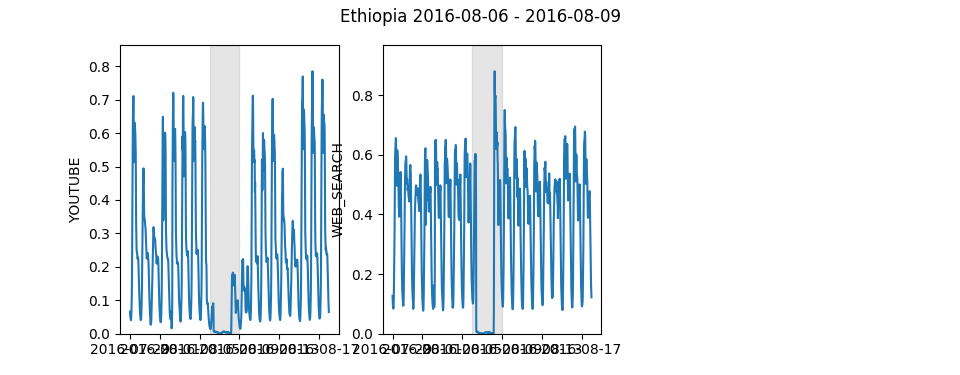

Ethiopia (ET) 2016-08-06 2016-08-09 Context: https://www.google.com/search?q=internet+Ethiopia&tbs=cdr%3A1%2Ccd_min%3A08%2F06%2F2016%2Ccd_max%3A08%2F13%2F2016 https://twitter.com/search?q=internet+Ethiopia+since%3A2016-08-06+until%3A2016-08-13 https://metrics.torproject.org/userstats-relay-country.html?events=on&start=2016-07-29&end=2016-08-18&country=ET
    YOUTUBE, 2016-08-06, 2016-08-09, 2.902301, 0.727582, https://transparencyreport.google.com/traffic/overview?lu=fraction_traffic&fraction_traffic=product%3A21%3Bstart%3A1469764800000%3Bend%3A1471492800000%3Bregion%3AET
    WEB_SEARCH, 2016-08-06, 2016-08-07, 1.899074, 0.586093, https://transparencyreport.google.com/traffic/overview?lu=fraction_traffic&fraction_traffic=product%3A19%3Bstart%3A1470110400000%3Bend%3A1470974400000%3Bregion%3AET


<IPython.core.display.Javascript object>


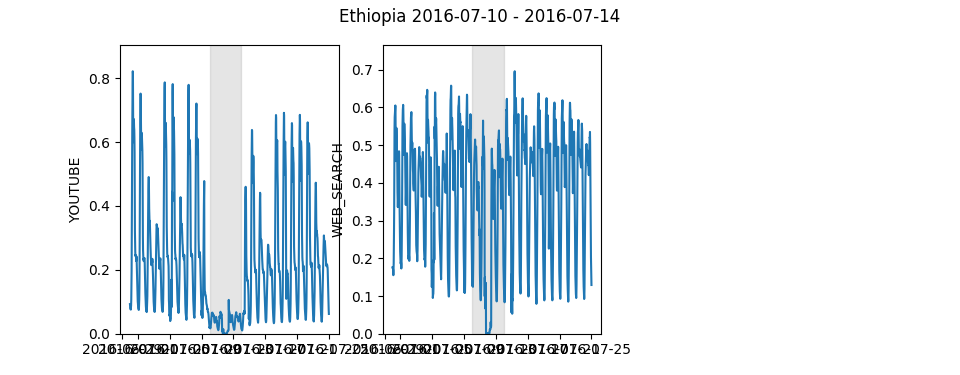

Ethiopia (ET) 2016-07-10 2016-07-14 Context: https://www.google.com/search?q=internet+Ethiopia&tbs=cdr%3A1%2Ccd_min%3A07%2F10%2F2016%2Ccd_max%3A07%2F17%2F2016 https://twitter.com/search?q=internet+Ethiopia+since%3A2016-07-10+until%3A2016-07-17 https://metrics.torproject.org/userstats-relay-country.html?events=on&start=2016-06-30&end=2016-07-25&country=ET
    YOUTUBE, 2016-07-10, 2016-07-14, 4.857482, 1.217730, https://transparencyreport.google.com/traffic/overview?lu=fraction_traffic&fraction_traffic=product%3A21%3Bstart%3A1467259200000%3Bend%3A1469419200000%3Bregion%3AET
    WEB_SEARCH, 2016-07-11, 2016-07-12, 1.158968, 0.357681, https://transparencyreport.google.com/traffic/overview?lu=fraction_traffic&fraction_traffic=product%3A19%3Bstart%3A1467864000000%3Bend%3A1468728000000%3Bregion%3AET


In [10]:
for region_disruption in all_disruptions:
    if region_disruption.region_code != "ET": continue
    show_disruption(region_disruption)
    fa.print_disruption_csv(region_disruption)

## Findings

### We can find internet shutdowns by looking at cross-product disruptions

In the example below, we can see shutdowns in July, August and October 2016, and end of May 2017.

<IPython.core.display.Javascript object>


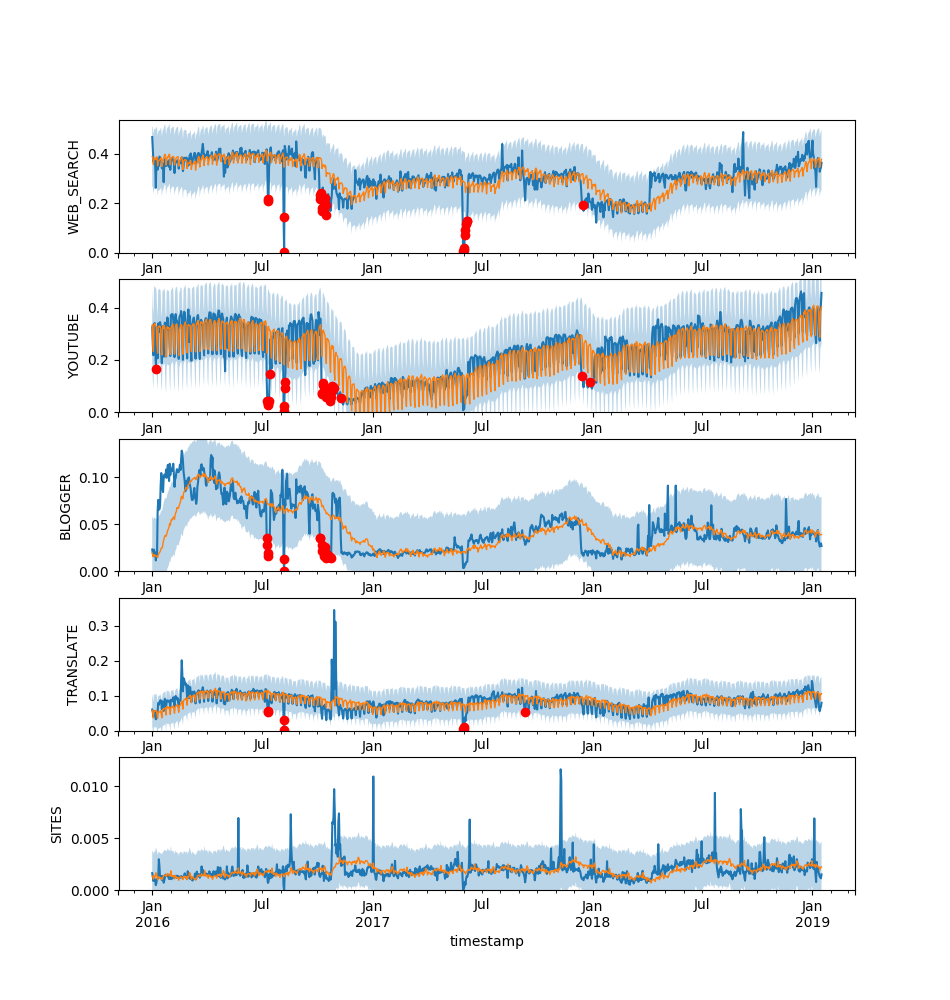

In [11]:
show_region_traffic("ET", [traffic.ProductId.WEB_SEARCH, traffic.ProductId.YOUTUBE,
                           traffic.ProductId.BLOGGER, traffic.ProductId.TRANSLATE,
                           traffic.ProductId.SITES])

### Product blocking

It's possible to use the traffic data to detect product blocking. In the charts below, you can see exactly when YouTube was blocked in Iran, Uzbequistan, and when Ethiopia blocked YouTube and Blogger.

<IPython.core.display.Javascript object>


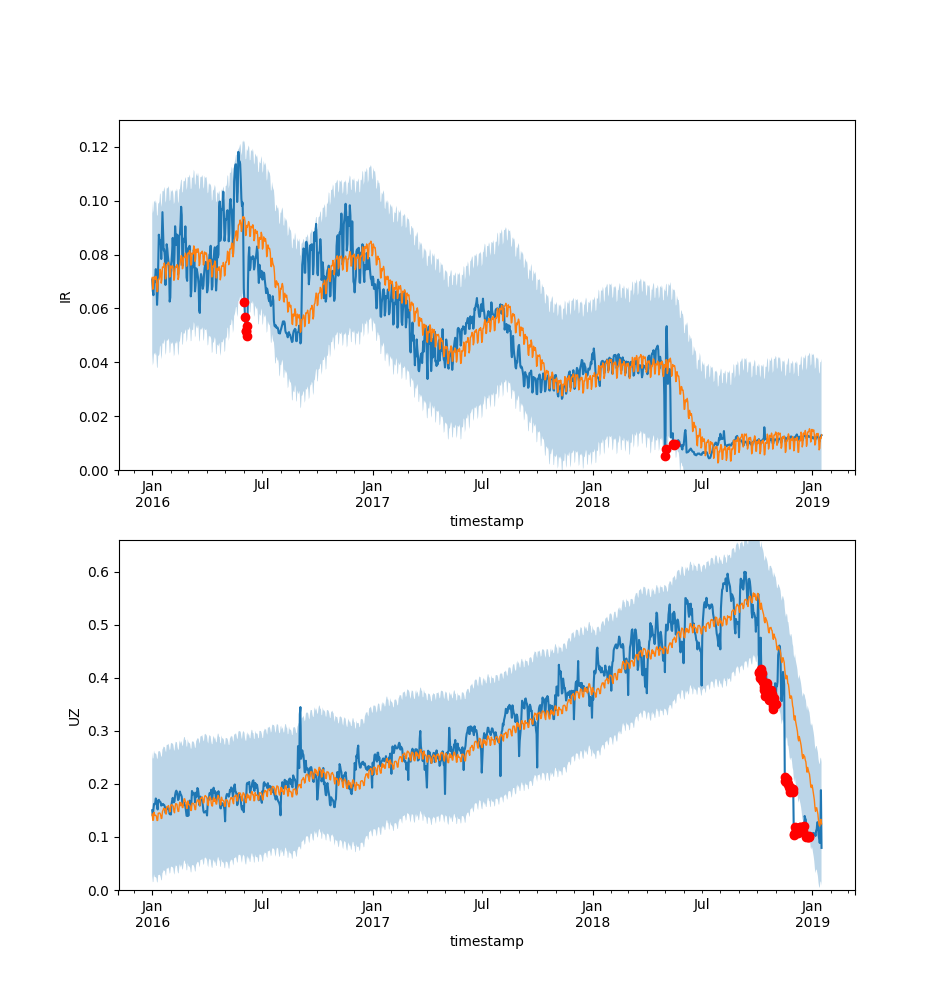

In [16]:
show_product_traffic(traffic.ProductId.YOUTUBE, ["IR", "UZ"])

<IPython.core.display.Javascript object>


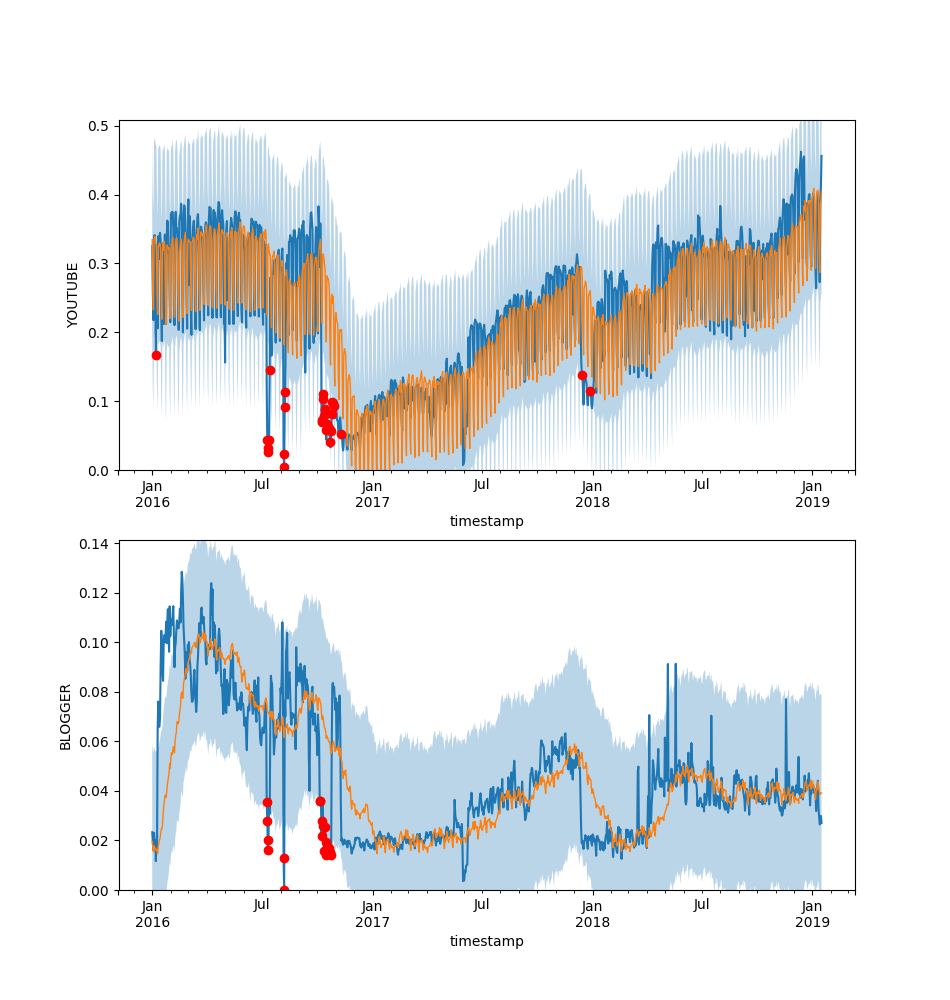

In [13]:
show_region_traffic("ET", [traffic.ProductId.YOUTUBE, traffic.ProductId.BLOGGER])

### Some anomalies may be due to shifts in geolocation and normalization

In October 2016 there was a big bump in YouTube traffic in the US, which seems to have affected the numbers for other countries.

It may be that traffic for other countries started being geolocated in the US. Furthermore, traffic numbers are relative to global traffic, and US traffic dominates the global traffic for some products. Increasing it significantly can reduce the traffic numbers for other countries.

<IPython.core.display.Javascript object>


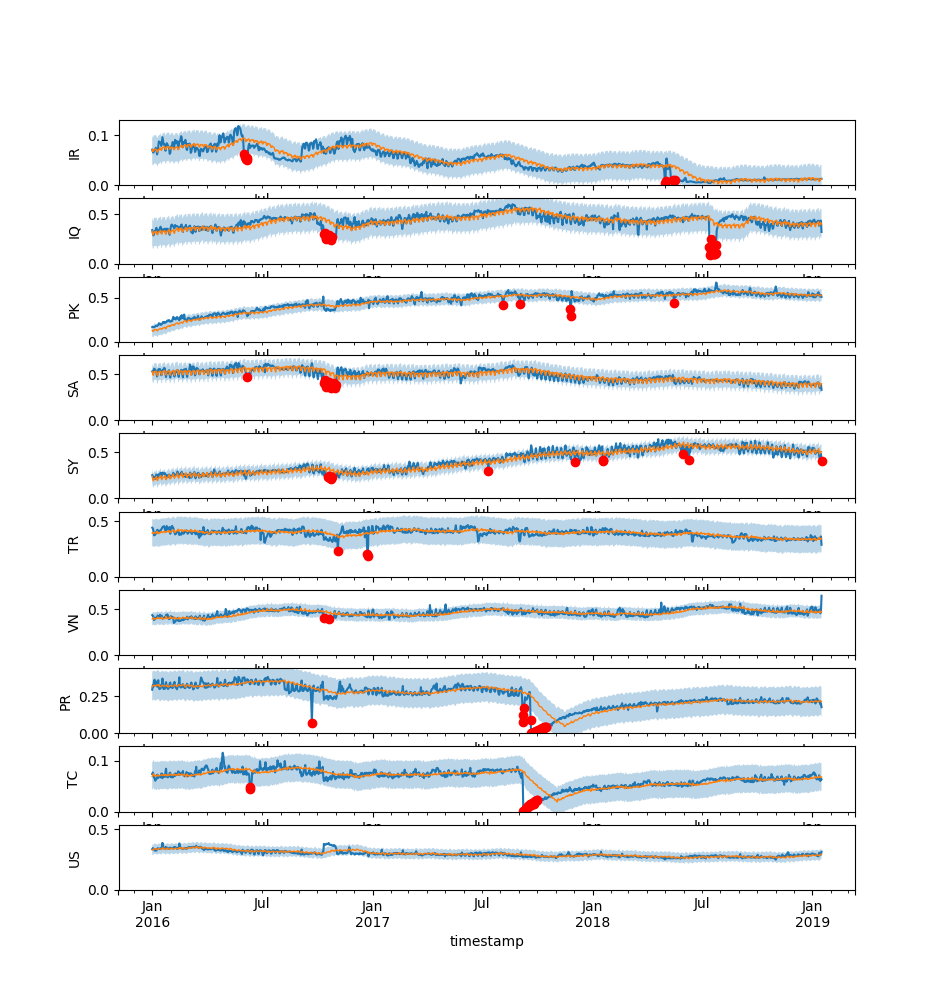

In [17]:
show_product_traffic(traffic.ProductId.YOUTUBE, [
    "IR", "IQ", "PK", "SA", "SY", "TR", "VN", "PR", "TC", "US"
])